## Setup, Loading Data and CDFs

In [1]:
DATA_NAME = 'segmentAnything-full' 
TRANSFORM = 'gabor'
CHANNEL = ''
PARAM_CSV = "gabor_new.csv"

In [2]:
path_list = DATA_NAME.split("-") + TRANSFORM.split("-")
if CHANNEL:
    path_list.append(CHANNEL)
print(f"Name the notebook:\n{'_'.join(path_list[::-1])}.ipynb")
FULL_DATA_NAME='-'.join(path_list)

Name the notebook:
gabor_full_segmentAnything.ipynb


In [3]:
import git
from pathlib import Path
import os
import pandas as pd
import numpy as np

ROOT_DIR = Path(git.Repo('.', search_parent_directories=True).working_tree_dir)
CWD = os.path.join(ROOT_DIR, "results", "case-studies", *path_list)

assert CWD == os.getcwd()
Path(os.path.join(CWD, "CSVs")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "plots")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "cache")).mkdir(exist_ok=True)

GROUP = 'layer' if TRANSFORM.split("-")[0] == 'wavelet' else ('band' if TRANSFORM.split("-")[0] == 'fourier' else 'filter_idx')
RERUN = False
SKIP_OPTIMIZE_STEP = False
CWD

'/Users/brandonmarks/Desktop/hierarchical-bayesian-model-validation/results/case-studies/segmentAnything/full/gabor'

In [4]:
os.chdir(os.path.join(ROOT_DIR, "utilities"))
from testing import * # If MATLAB is not installed, open utilities and set to False
from plotting import *
from learned import *
os.chdir(CWD)
np.random.seed(0)

In [5]:
group_data_map = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}.pickle'))
group_total_samples = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}-size.pickle'))

# treat all as nonskewed for gabor grouped over frequency
nonskewed_filter_idxs = list(group_data_map.keys())

df = pd.read_csv(os.path.join(ROOT_DIR, "gabor", PARAM_CSV), index_col="index")
df = df.sort_index()

filter_group_map = (df.loc[:, ["wave_number", "aspect_ratio", "frequency"]]
                      .apply(tuple, axis=1)
                      .to_dict())

filter_group_map

{0: (2.0, 0.5, 0.044),
 1: (2.0, 0.5, 0.065),
 2: (2.0, 0.5, 0.096),
 3: (2.0, 0.5, 0.141),
 4: (2.0, 0.5, 0.208),
 5: (2.0, 0.5, 0.306),
 6: (2.0, 0.5, 0.45),
 7: (2.0, 1.0, 0.044),
 8: (2.0, 1.0, 0.065),
 9: (2.0, 1.0, 0.096),
 10: (2.0, 1.0, 0.141),
 11: (2.0, 1.0, 0.208),
 12: (2.0, 1.0, 0.306),
 13: (2.0, 1.0, 0.45),
 14: (3.0, 0.5, 0.044),
 15: (3.0, 0.5, 0.065),
 16: (3.0, 0.5, 0.096),
 17: (3.0, 0.5, 0.141),
 18: (3.0, 0.5, 0.208),
 19: (3.0, 0.5, 0.306),
 20: (3.0, 0.5, 0.45),
 21: (3.0, 1.0, 0.044),
 22: (3.0, 1.0, 0.065),
 23: (3.0, 1.0, 0.096),
 24: (3.0, 1.0, 0.141),
 25: (3.0, 1.0, 0.208),
 26: (3.0, 1.0, 0.306),
 27: (3.0, 1.0, 0.45),
 28: (4.0, 0.5, 0.044),
 29: (4.0, 0.5, 0.065),
 30: (4.0, 0.5, 0.096),
 31: (4.0, 0.5, 0.141),
 32: (4.0, 0.5, 0.208),
 33: (4.0, 0.5, 0.306),
 34: (4.0, 0.5, 0.45),
 35: (4.0, 1.0, 0.044),
 36: (4.0, 1.0, 0.065),
 37: (4.0, 1.0, 0.096),
 38: (4.0, 1.0, 0.141),
 39: (4.0, 1.0, 0.208),
 40: (4.0, 1.0, 0.306),
 41: (4.0, 1.0, 0.45)}

In [6]:
if 'fourier' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)[::3]
elif 'wavelet' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)
elif 'learned' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters
elif 'gabor' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters

cdfs_dir = os.path.join(ROOT_DIR, "results", "CDFs")
cdfs_list = sorted([os.path.join(cdfs_dir, i) for i in os.listdir(cdfs_dir)])
all_cdfs = combine_pickles(cdfs_list[0])
for cdf_dir in cdfs_list[:6]: # TODO For quick testing purposes. Currently excluding 20000 CDFs. Use cdfs_list[5:6] to access CDFs/_test
    all_cdfs = all_cdfs | combine_pickles(cdf_dir)
    
# group_data_map = {g : group_data_map[g][::100] for g in GROUPS} # TODO For quick testing purposes
group_total_samples

{0: 786432000,
 1: 786432000,
 2: 786432000,
 3: 786432000,
 4: 786432000,
 5: 786432000,
 6: 786432000,
 7: 786432000,
 8: 786432000,
 9: 786432000,
 10: 786432000,
 11: 786432000,
 12: 786432000,
 13: 786432000,
 14: 786432000,
 15: 786432000,
 16: 786432000,
 17: 786432000,
 18: 786432000,
 19: 786432000}

Running 12760 CDFs


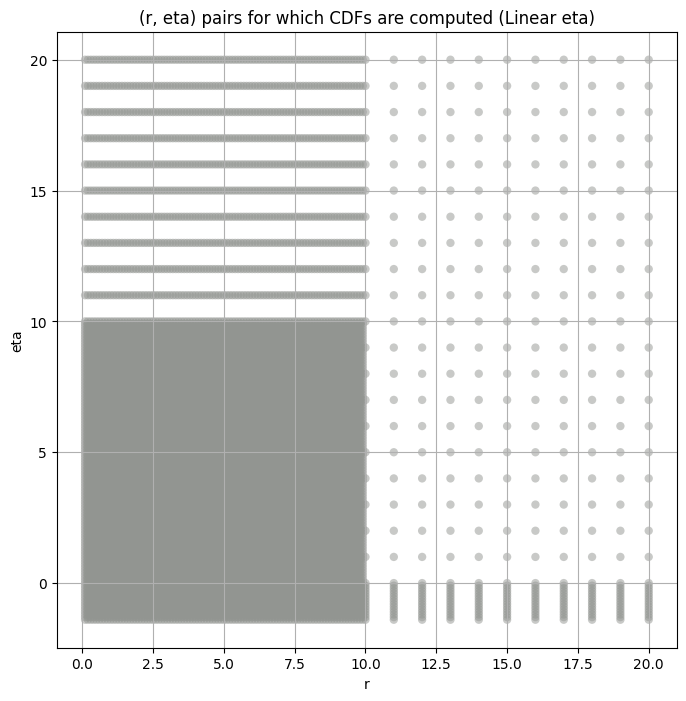

,"(r,eta),cdf",r,eta,cdf,variance,kurtosis
0,"((0.1, -1.4), <scipy.interpolate._fitpack2.Int...",0.1,-1.4,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.628800e+06,554265.000000
1,"((0.1, -1.3), <scipy.interpolate._fitpack2.Int...",0.1,-1.3,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.991680e+07,96192.272727
2,"((0.1, -1.2), <scipy.interpolate._fitpack2.Int...",0.1,-1.2,<scipy.interpolate._fitpack2.InterpolatedUniva...,2.395008e+08,29390.000000
3,"((0.1, -1.1), <scipy.interpolate._fitpack2.Int...",0.1,-1.1,<scipy.interpolate._fitpack2.InterpolatedUniva...,1.037837e+09,11997.692308
4,"((0.1, -1.0), <scipy.interpolate._fitpack2.Int...",0.1,-1.0,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.632429e+09,5874.890110


In [7]:
warnings.filterwarnings('ignore', category=RuntimeWarning)

all_cdfs_df = create_kurt_var_ksstat_df(all_cdfs)
fine_cdfs_df = all_cdfs_df.copy()
all_cdfs_df = all_cdfs_df[(np.round(all_cdfs_df['r'], 1) == all_cdfs_df['r']) & (np.round(all_cdfs_df['eta'], 1) == all_cdfs_df['eta'])]
all_cdfs_df = all_cdfs_df.reset_index(drop=True)
all_cdfs = {x[0] : x[1] for x in all_cdfs_df["(r,eta),cdf"]}
                                             
var_values_dict = dict()
kurt_values_dict = dict()
master_df = pd.DataFrame(columns=[GROUP]).set_index(GROUP)
temp_cdf = all_cdfs_df
print(f"Running {all_cdfs_df.shape[0]} CDFs")
create_scatter_plot(all_cdfs_df);
all_cdfs_df.head()

## Bootstrapping the Variance and Kurtosis

In [8]:
n_bootstrap = int(1e3) # TODO For quick testing purposes
bootstrap_size = int(1e3) # TODO For quick testing purposes
ci = 0.99

In [9]:
bootstrap_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))
master_df_var_kurt_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

if True or not master_df_var_kurt_path.exists(): # TODO For quick testing purposes
    for group in GROUPS:
        print(f'{GROUP.capitalize()} {group}: {str(filter_group_map[group])}')
        obs_var, var_lower, var_upper, var_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                n_bootstrap=n_bootstrap, 
                                                                                bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                metric= np.var, 
                                                                                ci=ci)
        obs_kurt, kurt_lower, kurt_upper, kurt_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                    n_bootstrap=n_bootstrap, 
                                                                                    bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                    metric= stats.kurtosis, ci=ci)  
        master_df.loc[group, 'obs_var'], master_df.loc[group, 'var_lower'], master_df.loc[group, 'var_upper'] = obs_var, var_lower, var_upper
        master_df.loc[group, 'obs_kurt'], master_df.loc[group, 'kurt_lower'], master_df.loc[group, 'kurt_upper'] = obs_kurt, kurt_lower, kurt_upper
        master_df.loc[group, 'total_samples'] = group_total_samples[group]
        master_df.loc[group, 'filter_group'] = str(filter_group_map[group])

    master_df.to_csv(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

master_df = pd.read_csv(master_df_var_kurt_path, index_col=GROUP)
var_kurt_df = pd.read_csv(bootstrap_path, index_col=GROUP)
master_df

Filter_idx 0: (2.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 1: (2.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 2: (2.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 3: (2.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 4: (2.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 5: (2.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 6: (2.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 7: (2.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 8: (2.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 9: (2.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 10: (2.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 11: (2.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 12: (2.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 13: (2.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 14: (3.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 15: (3.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 16: (3.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 17: (3.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 18: (3.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 19: (3.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group
filter_idx,,,,,,,,
0,82714.227802,65332.828392,101670.798673,4.835839,2.616254,11.097661,786432000.0,"(2.0, 0.5, 0.044)"
1,23392.376059,18653.036103,29341.232192,5.260869,2.674575,14.926199,786432000.0,"(2.0, 0.5, 0.065)"
2,6157.994304,4900.891337,7691.819574,6.138149,3.006038,22.037119,786432000.0,"(2.0, 0.5, 0.096)"
3,1691.274631,1308.193699,2148.475904,7.471019,3.699209,22.976694,786432000.0,"(2.0, 0.5, 0.141)"
4,403.765609,301.934089,516.153452,9.585465,4.791787,33.305756,786432000.0,"(2.0, 0.5, 0.208)"
5,110852.005620,87987.228134,138799.457603,6.427257,2.552370,21.803500,786432000.0,"(2.0, 0.5, 0.306)"
6,30341.331809,23706.929418,38750.195564,6.600692,3.268219,22.201661,786432000.0,"(2.0, 0.5, 0.45)"
7,8126.168986,6407.307568,10651.946921,7.818029,3.648606,34.370055,786432000.0,"(2.0, 1.0, 0.044)"
8,2232.110624,1691.369525,3017.172276,9.292237,3.960677,39.671193,786432000.0,"(2.0, 1.0, 0.065)"


## Initial Grid Search and Hypothesis Test Plots

In [10]:
EXCLUDE_CUTOFFS = [0, 50, 100, 200] # TODO For quick testing purposes
SCALE_CAP = 1e5

In [11]:
augmented_var_df_path = Path(os.path.join(CWD, "CSVs", "augmented_var_df.csv"))
augmented_var_df = var_kurt_df[['obs_var']].copy()
augmented_var_df
for val in EXCLUDE_CUTOFFS:
    temp_arr = []
    for group in GROUPS:
        if val != 0:
            temp_arr.append(np.var(group_data_map[group][val:-val]))
        else:
            temp_arr.append(np.var(group_data_map[group]))

    augmented_var_df[f"var_exclude_{val}"] = temp_arr
augmented_var_df

,obs_var,var_exclude_0,var_exclude_50,var_exclude_100,var_exclude_200
filter_idx,,,,,
0,82714.227802,82714.227802,79650.394938,77626.488185,74419.278372
1,23392.376059,23392.376059,22478.440076,21883.295489,20947.396174
2,6157.994304,6157.994304,5895.388471,5729.028455,5467.786798
3,1691.274631,1691.274631,1610.130772,1559.435815,1480.637923
4,403.765609,403.765609,381.133111,367.124549,345.692692
5,110852.005620,110852.005620,105519.317964,102513.607007,97889.333462
6,30341.331809,30341.331809,28952.746787,28095.831718,26762.598793
7,8126.168986,8126.168986,7711.150408,7465.587411,7087.557607
8,2232.110624,2232.110624,2105.965716,2031.915378,1919.425021


####
Filter_idx, 0: (2.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 0 0.0044064042181127805 82714.22780188349


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 50 0.005917977655663778 79650.39493795564


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 100 0.007450987477451543 77626.48818495999


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 200 0.008405999471884806 74419.27837218513
Number of samples: 100000, Without approximation : 786432000.0


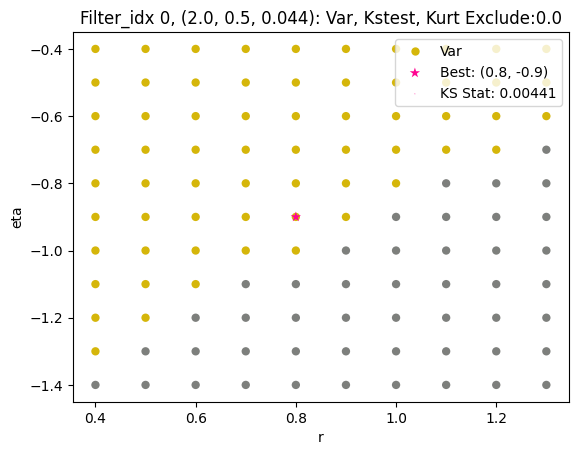

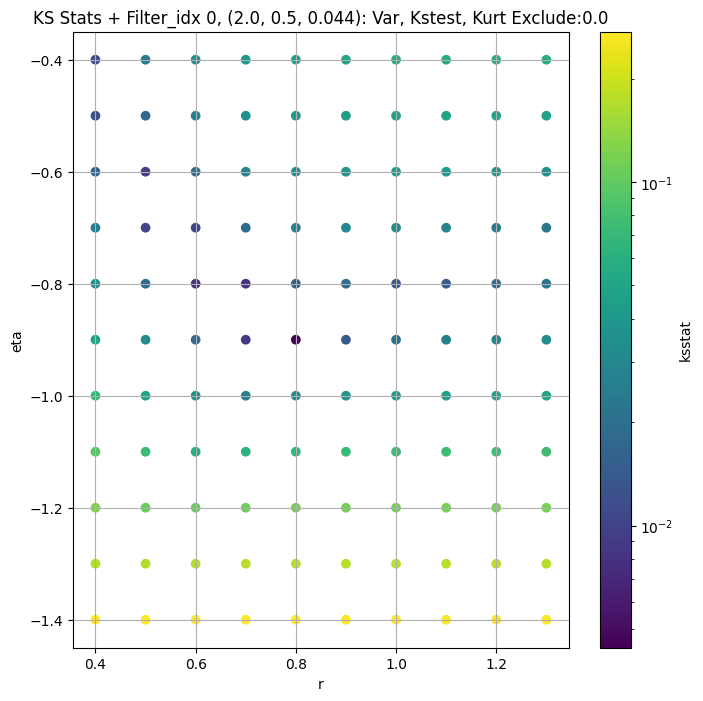

####
Filter_idx, 1: (2.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 0 0.005372468554935825 23392.376058564598


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 50 0.004723544426954329 22478.440076070954


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 100 0.006142200425559796 21883.29548925212


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 200 0.006943849754062925 20947.396174252528
Number of samples: 100000, Without approximation : 786432000.0


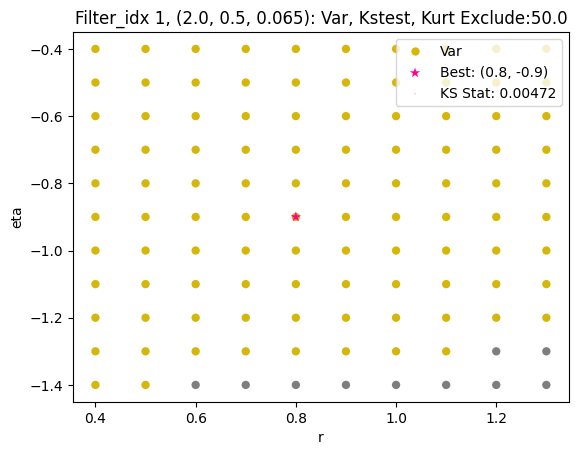

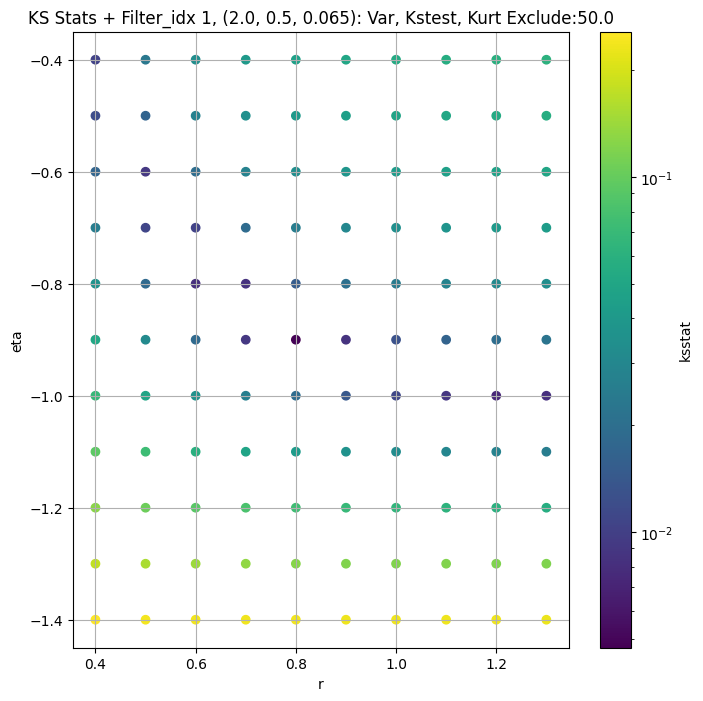

####
Filter_idx, 2: (2.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 0 0.006843938361523749 6157.994303634577


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 50 0.004837350679986918 5895.3884710888215


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 100 0.006299009957692919 5729.028455330964


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 200 0.007138871169984351 5467.786797745992
Number of samples: 100000, Without approximation : 786432000.0


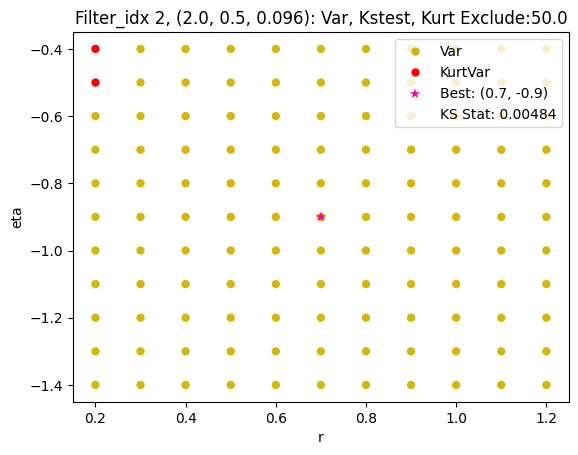

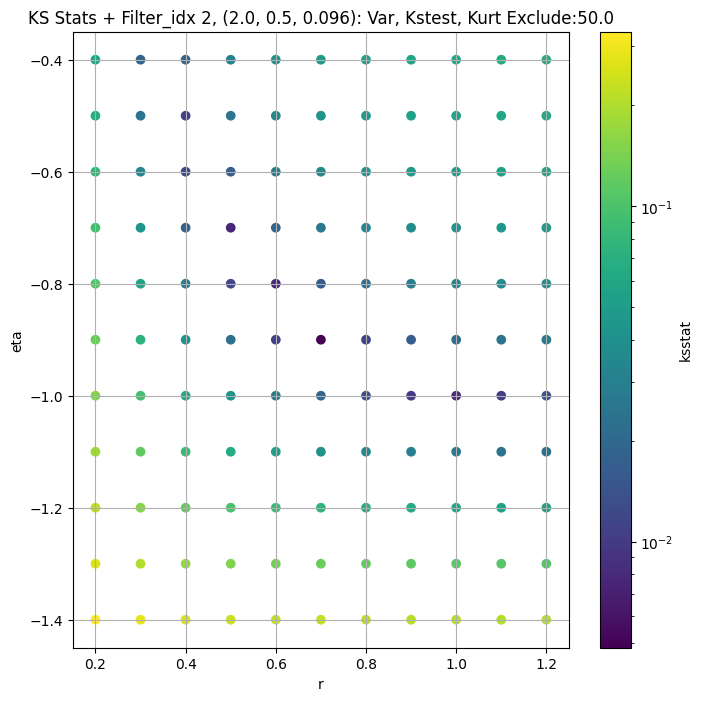

####
Filter_idx, 3: (2.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 0 0.007031613888462379 1691.2746308429878


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 50 0.006498107694518196 1610.1307722220972


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 100 0.006374596624449669 1559.4358148847648


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 200 0.009114493406682467 1480.6379233686046
Number of samples: 100000, Without approximation : 786432000.0


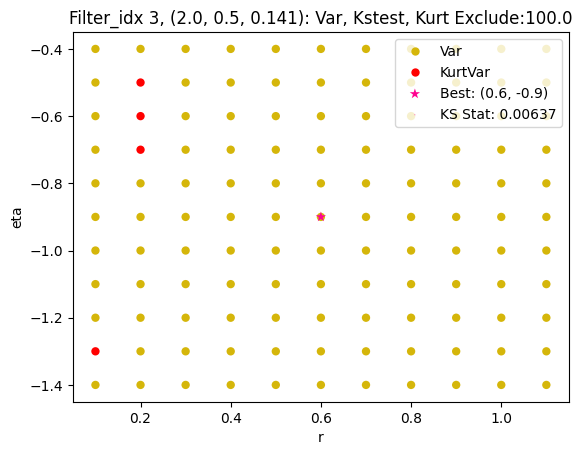

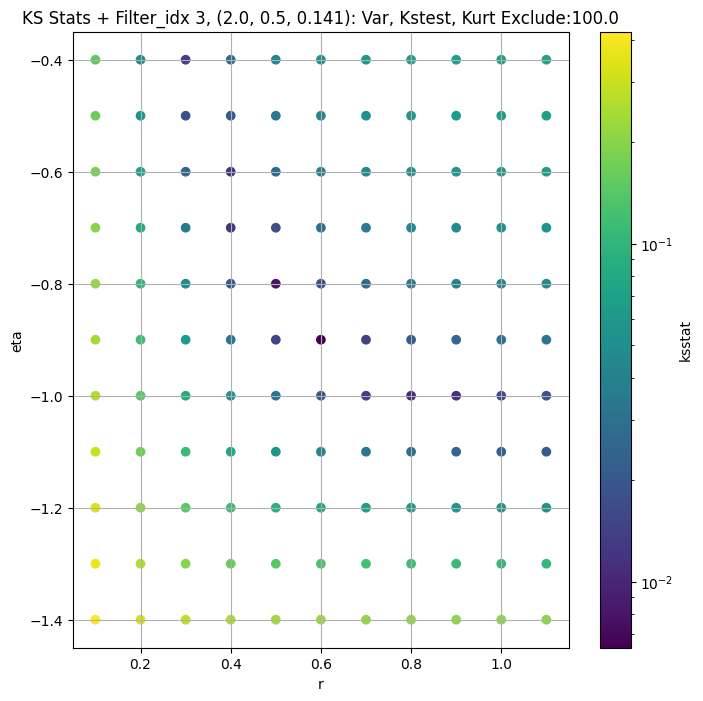

####
Filter_idx, 4: (2.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 0 0.0060880265883525575 403.765608970525


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 50 0.0072117776972464576 381.13311084311437


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 100 0.007507570557685805 367.1245488976918


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 200 0.008570633349049894 345.69269177731127
Number of samples: 100000, Without approximation : 786432000.0


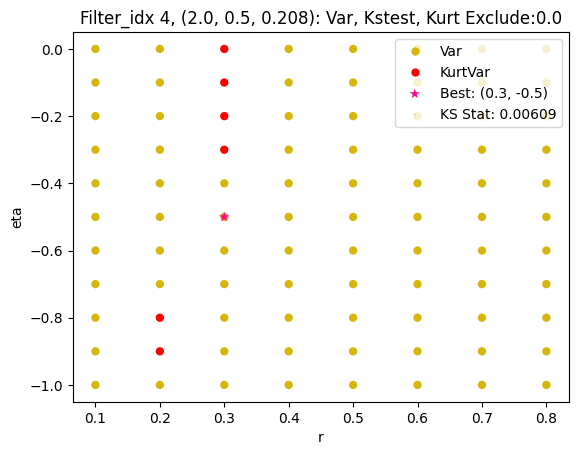

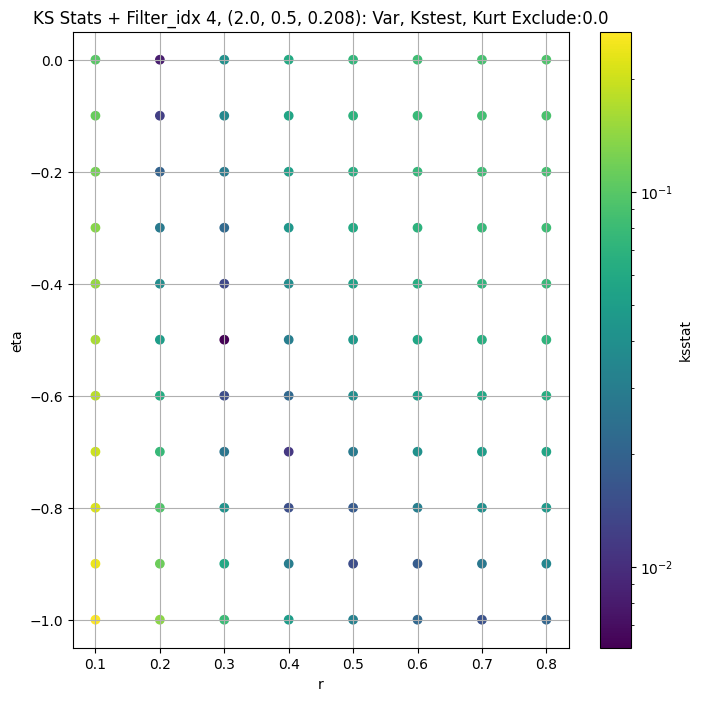

####
Filter_idx, 5: (2.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 0 0.005413316788486333 110852.00561993424


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 50 0.004213919167628588 105519.31796410758


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 100 0.005776011249248203 102513.60700669764


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 200 0.0071252884102694924 97889.33346249157
Number of samples: 100000, Without approximation : 786432000.0


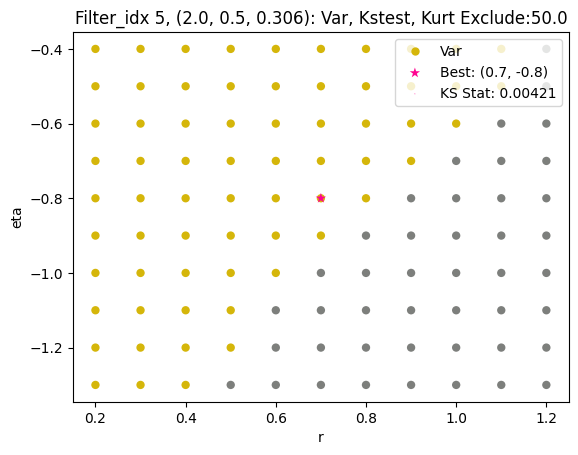

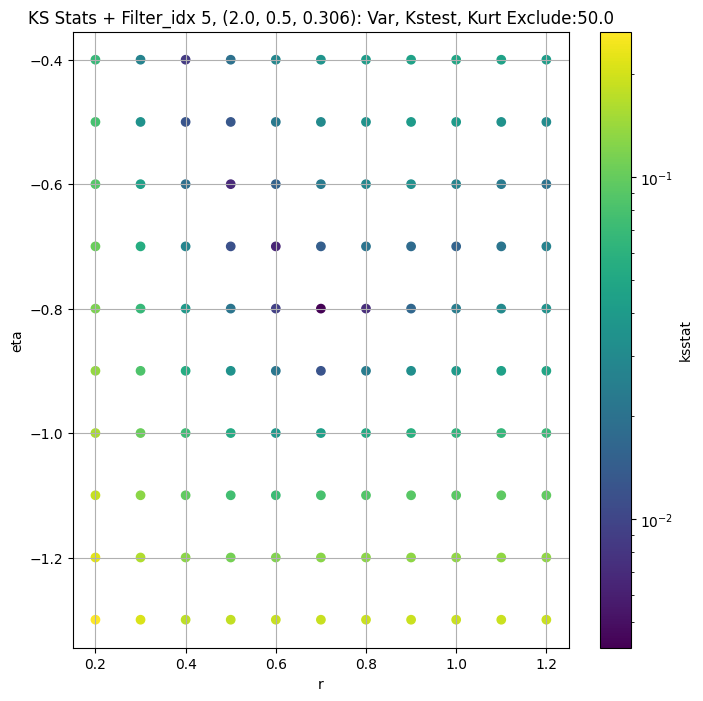

####
Filter_idx, 6: (2.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 0 0.0029165607929884096 30341.331808727547


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 50 0.003946337606381856 28952.746786521177


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 100 0.004528628701769177 28095.831718498463


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 200 0.005730979404690584 26762.59879315874
Number of samples: 100000, Without approximation : 786432000.0


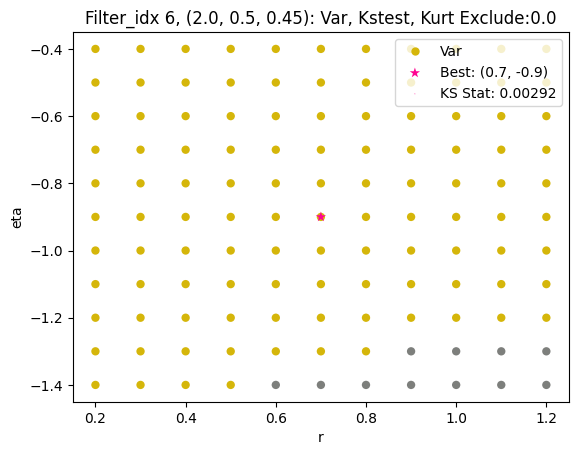

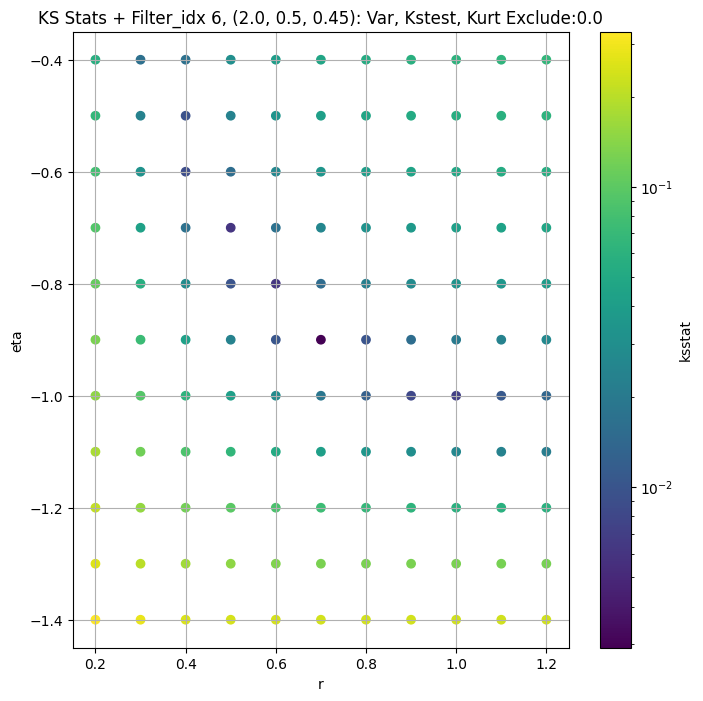

####
Filter_idx, 7: (2.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 0 0.004219084234102666 8126.168986454247


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 50 0.004622529938730913 7711.15040848898


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 100 0.004590285968575691 7465.587411191727


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 200 0.005492708640818078 7087.55760715904
Number of samples: 100000, Without approximation : 786432000.0


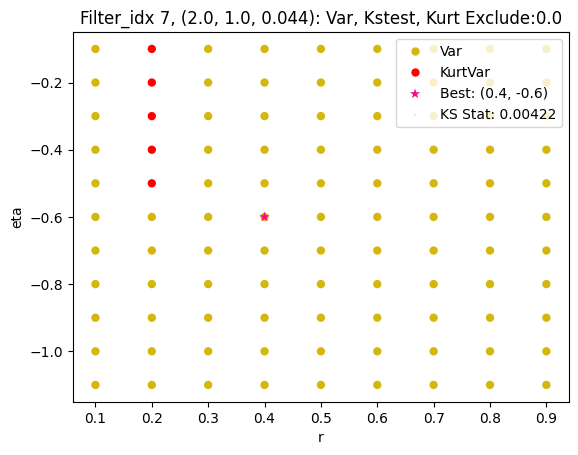

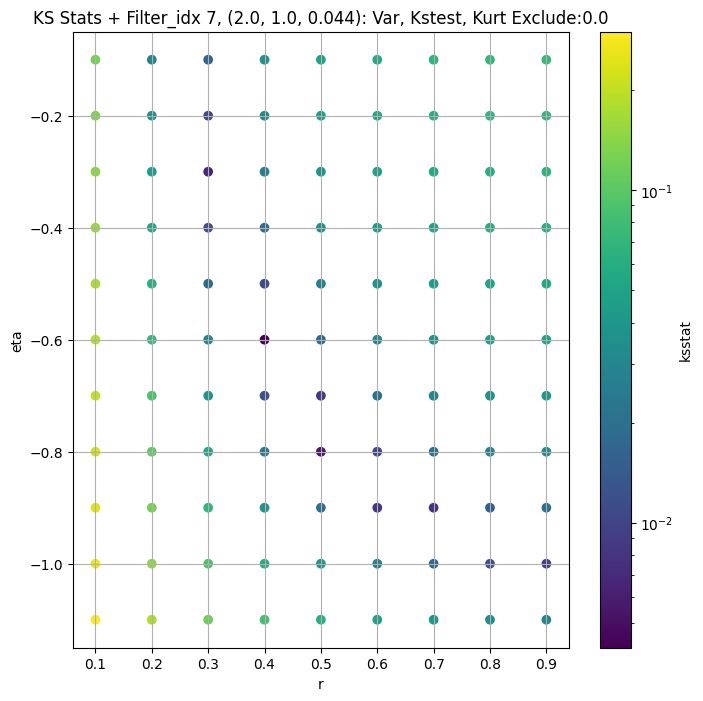

####
Filter_idx, 8: (2.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 0 0.004416547391706965 2232.110624370132


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 50 0.005293248941316886 2105.9657157493334


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 100 0.005766633571826454 2031.9153781977373


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 200 0.008058838548365643 1919.4250211554006
Number of samples: 100000, Without approximation : 786432000.0


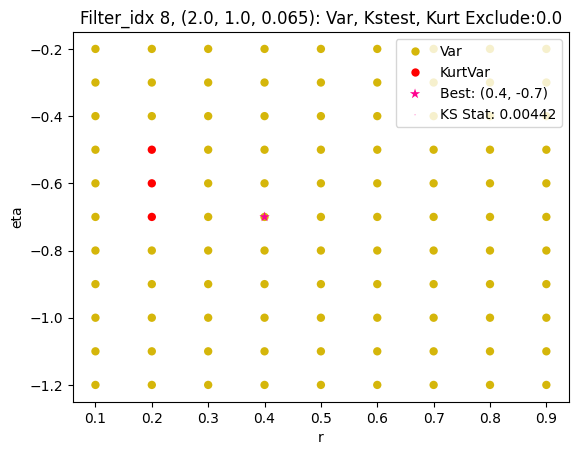

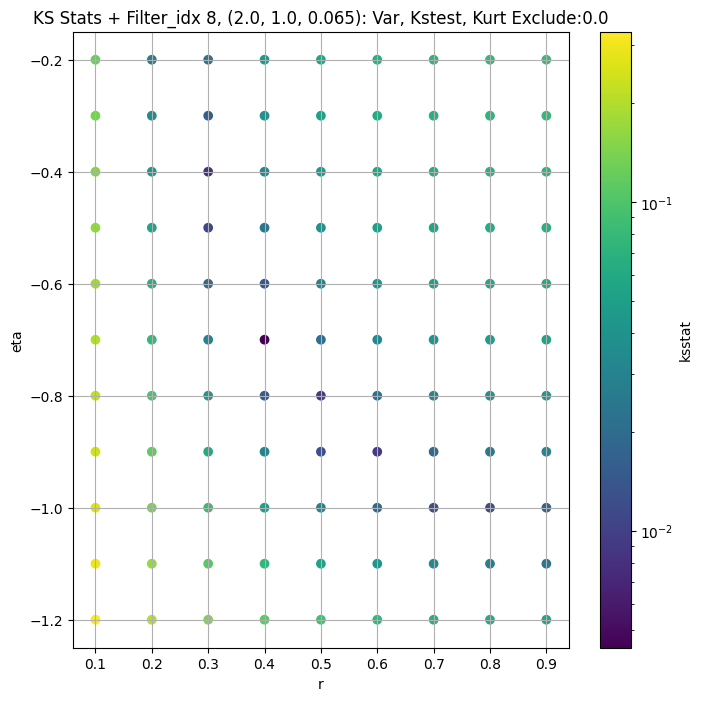

####
Filter_idx, 9: (2.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 0 0.0055416837024427346 565.5642946956925


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 50 0.006772303804908952 528.5398589832888


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 100 0.00640721167049399 507.39935345634365


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 200 0.007111232528664191 475.74158027911903
Number of samples: 100000, Without approximation : 786432000.0


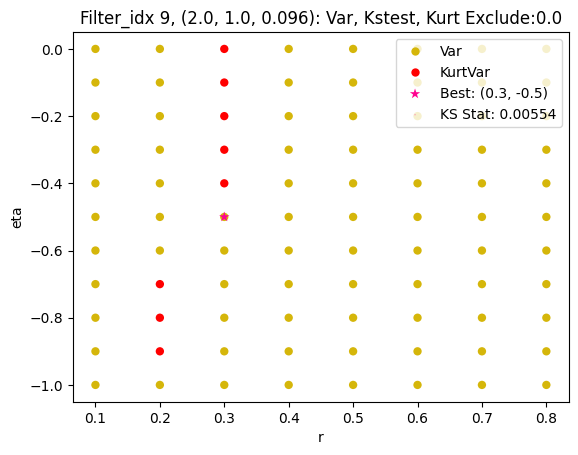

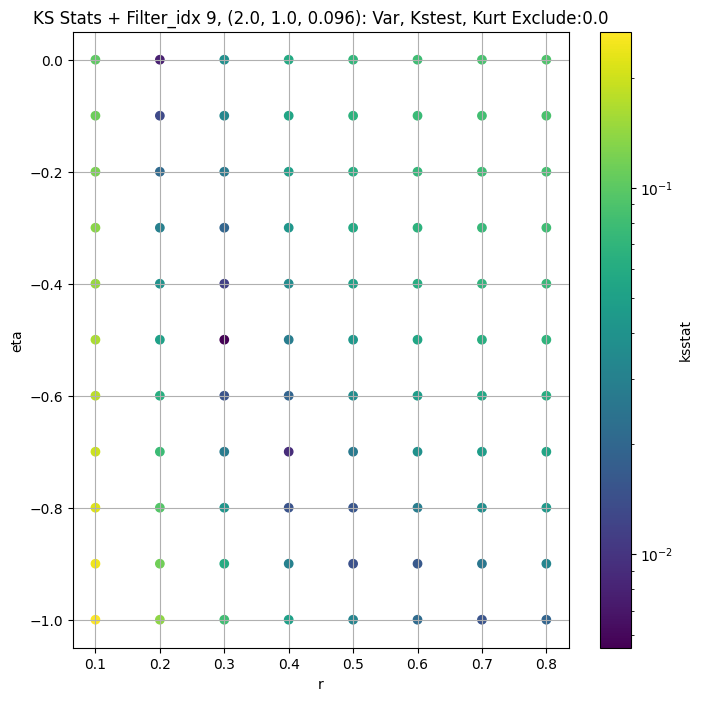

####
Filter_idx, 10: (2.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 0 0.005549091886861701 86145.24942030084


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 50 0.004158955615894189 82425.37638933184


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 100 0.005754038790222377 80031.93981911521


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 200 0.006524546827412547 76292.87552863473
Number of samples: 100000, Without approximation : 786432000.0


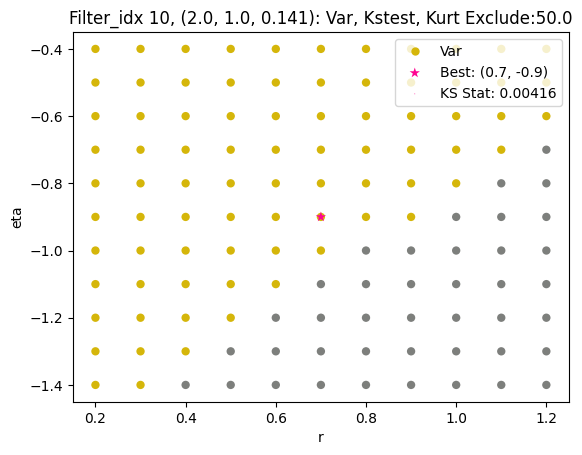

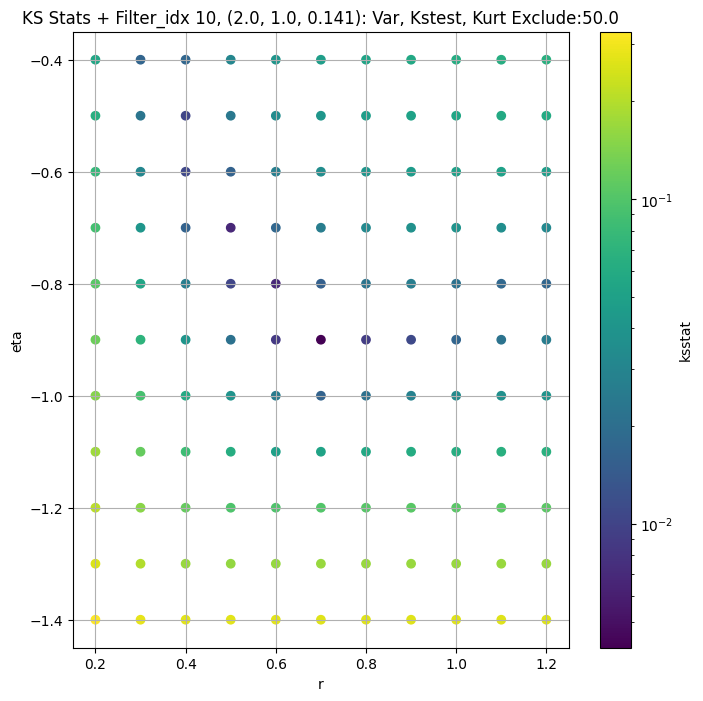

####
Filter_idx, 11: (2.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 0 0.0052742050752973 21748.63805825821


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 50 0.005226936233827431 20713.41157730476


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 100 0.0068248470538220946 20072.625040686482


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 200 0.006314424844744981 19075.083809556378
Number of samples: 100000, Without approximation : 786432000.0


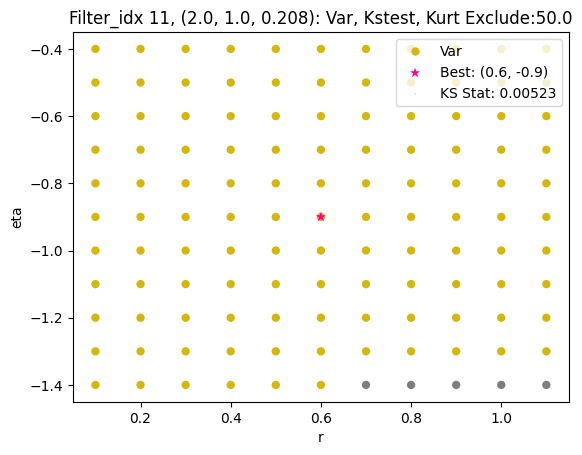

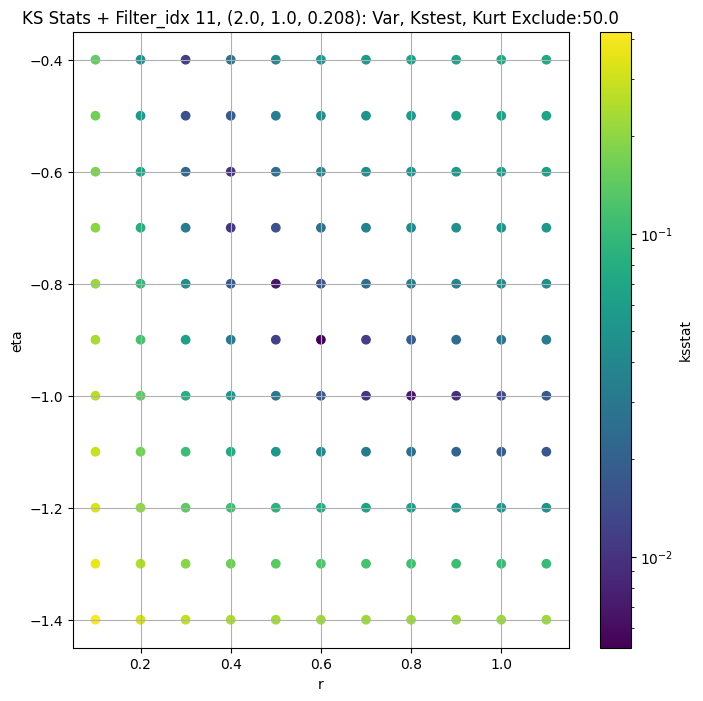

####
Filter_idx, 12: (2.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 0 0.005002119624503476 6076.052420963615


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 50 0.00750046489922096 5762.302090142208


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 100 0.00801418794963804 5573.2972095135665


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 200 0.006437118801779551 5282.238370126984
Number of samples: 100000, Without approximation : 786432000.0


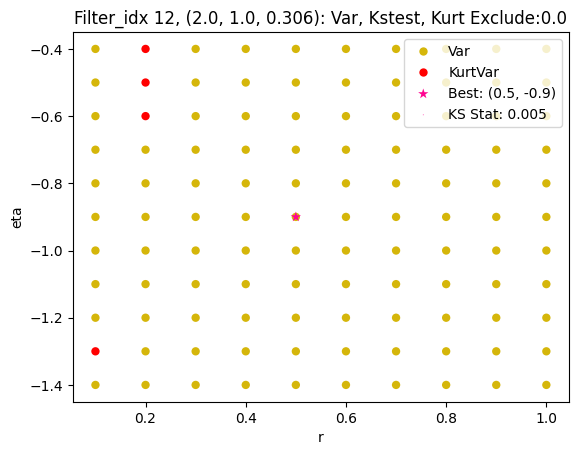

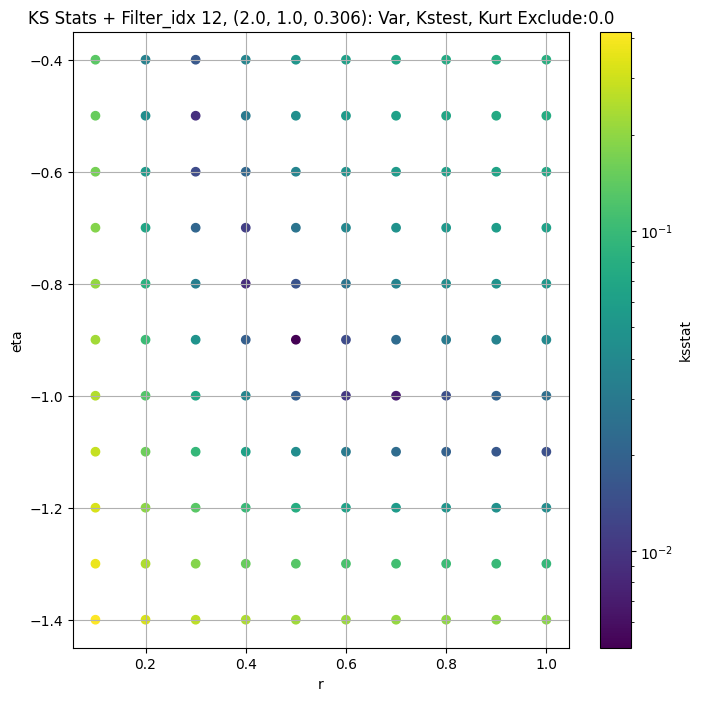

####
Filter_idx, 13: (2.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 0 0.005550596963885823 1691.2470712563852


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 50 0.005631287235317695 1591.1978488124798


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 100 0.006543419012799048 1533.6573470013973


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 200 0.00889250172843703 1445.8805511173043
Number of samples: 100000, Without approximation : 786432000.0


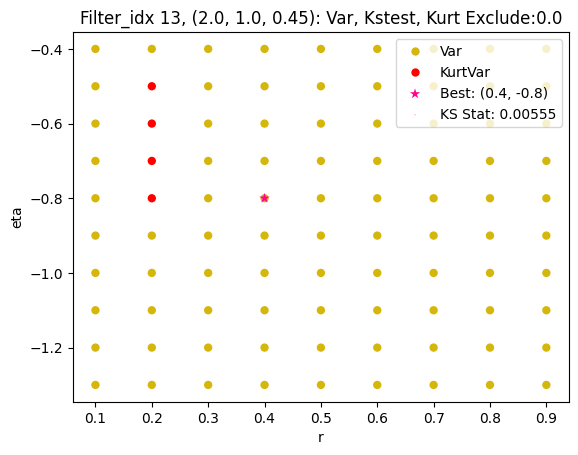

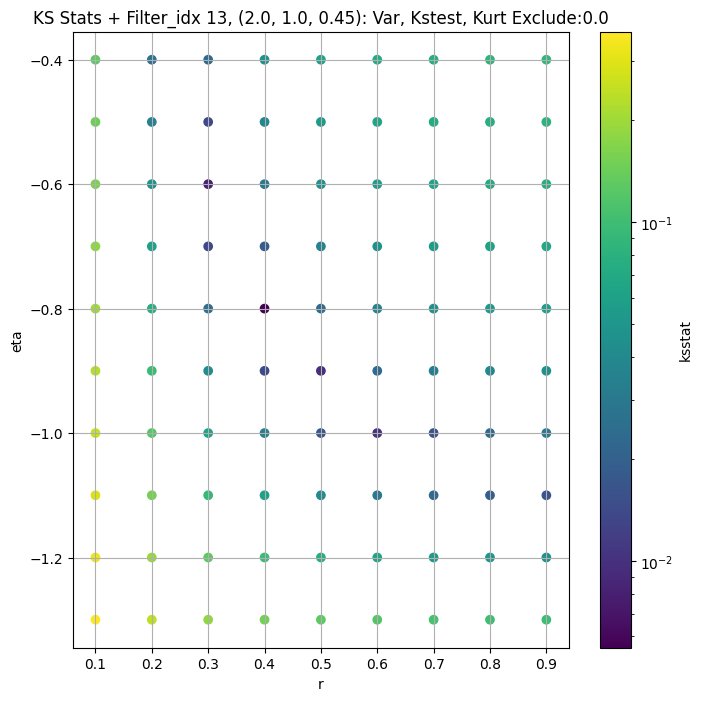

####
Filter_idx, 14: (3.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 0 0.006025638359968888 414.0813163355717


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 50 0.005754416921597172 384.8064783194706


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 100 0.007262414595250288 368.33735497535633


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 200 0.008432983636966096 343.78585395503205
Number of samples: 100000, Without approximation : 786432000.0


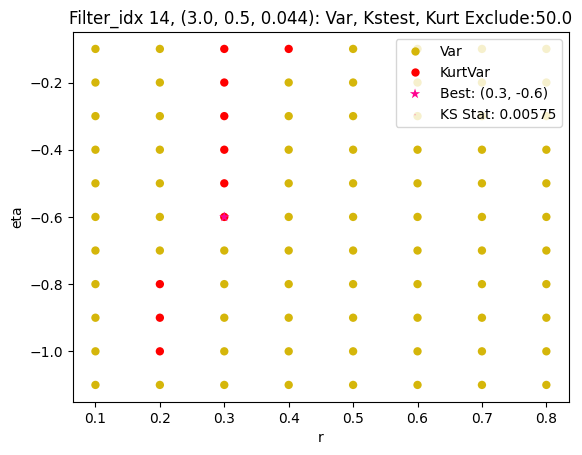

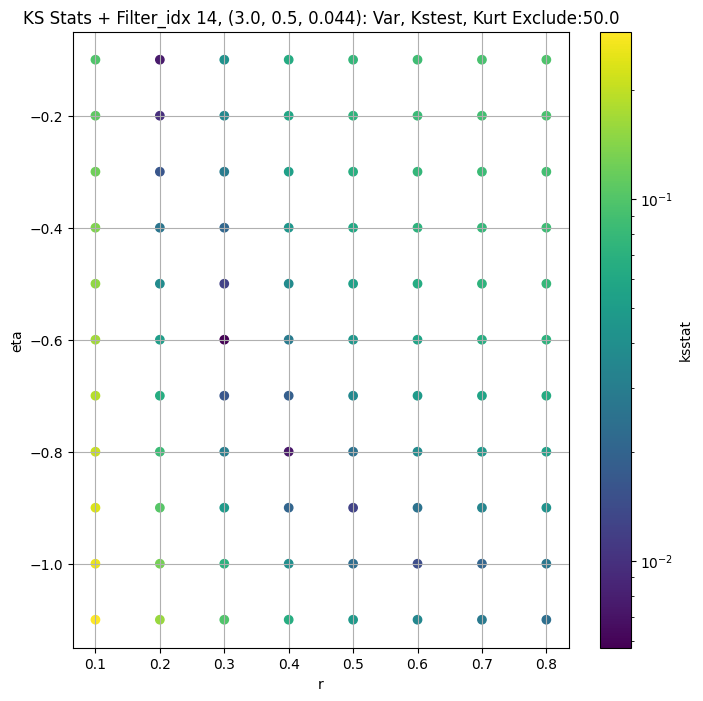

####
Filter_idx, 15: (3.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 0 0.0033059501162828187 100065.78976129922


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 50 0.0032329604043561666 93928.39398211366


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 100 0.005279699423487577 90406.5742495326


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 200 0.0055585195649663355 85112.10732285661
Number of samples: 100000, Without approximation : 786432000.0


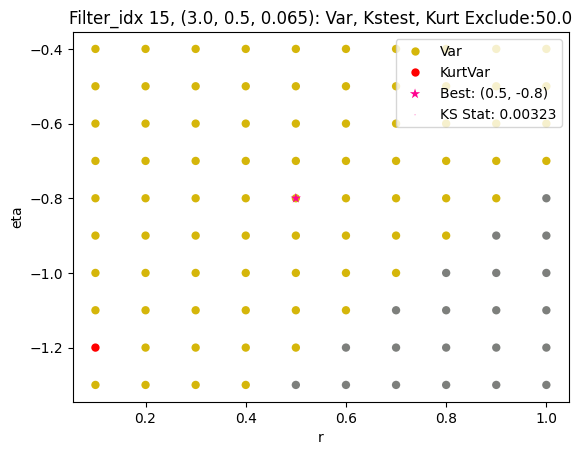

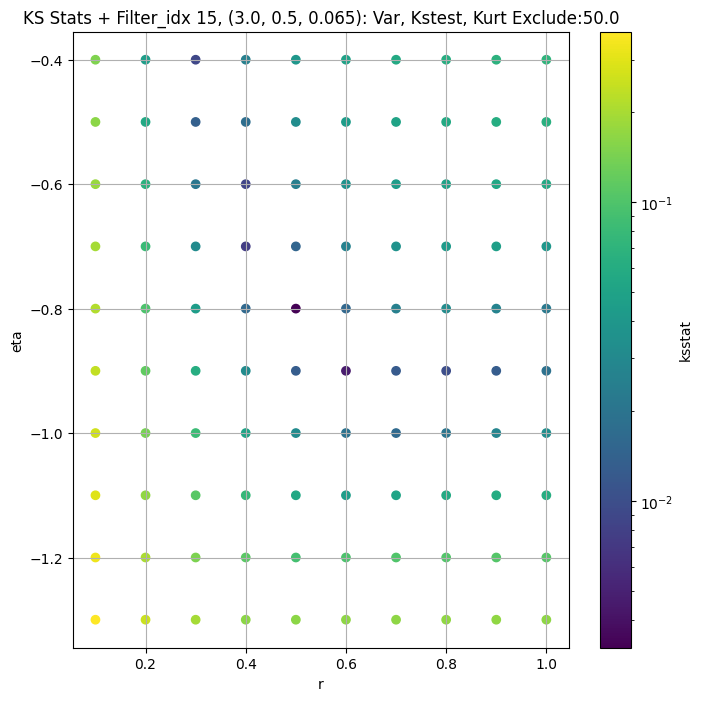

####
Filter_idx, 16: (3.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 0 0.003888678947168156 26510.01595439632


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 50 0.005106597443508387 24834.866081932654


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 100 0.0040091640794521766 23874.930301490032


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 200 0.006063796888882658 22448.65535115309
Number of samples: 100000, Without approximation : 786432000.0


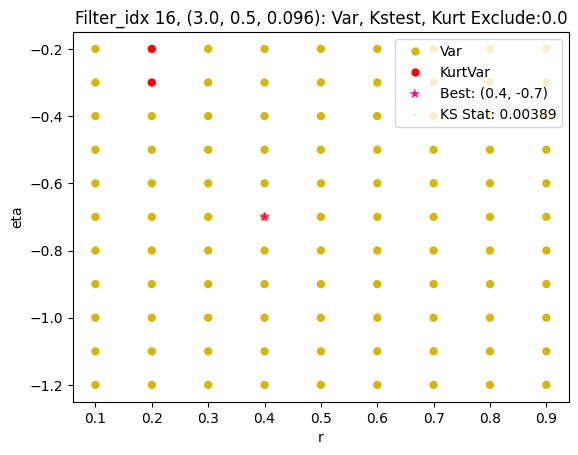

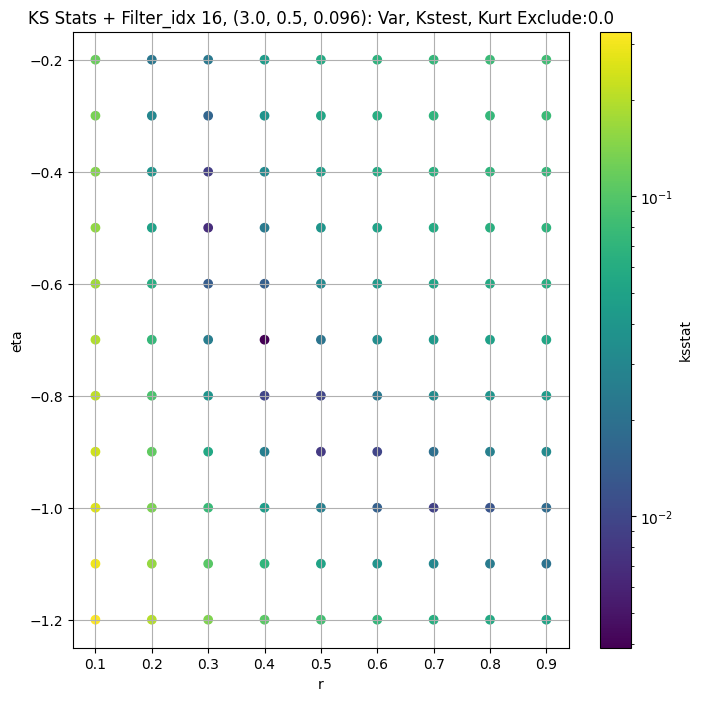

####
Filter_idx, 17: (3.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 0 0.003550261589573167 6989.307155123162


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 50 0.005777853056709192 6484.40625542368


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 100 0.00654509964672112 6214.041342024648


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 200 0.00753844819861782 5814.367273371366
Number of samples: 100000, Without approximation : 786432000.0


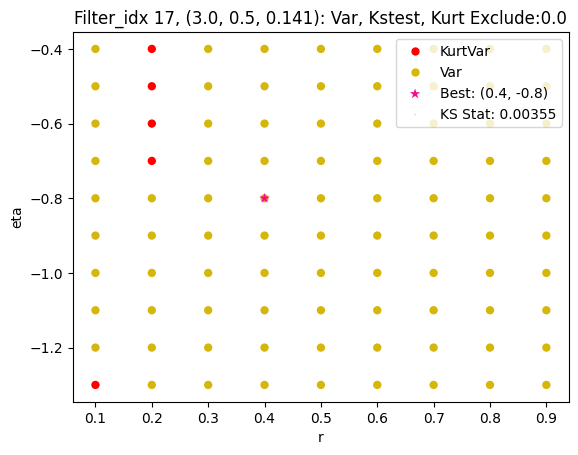

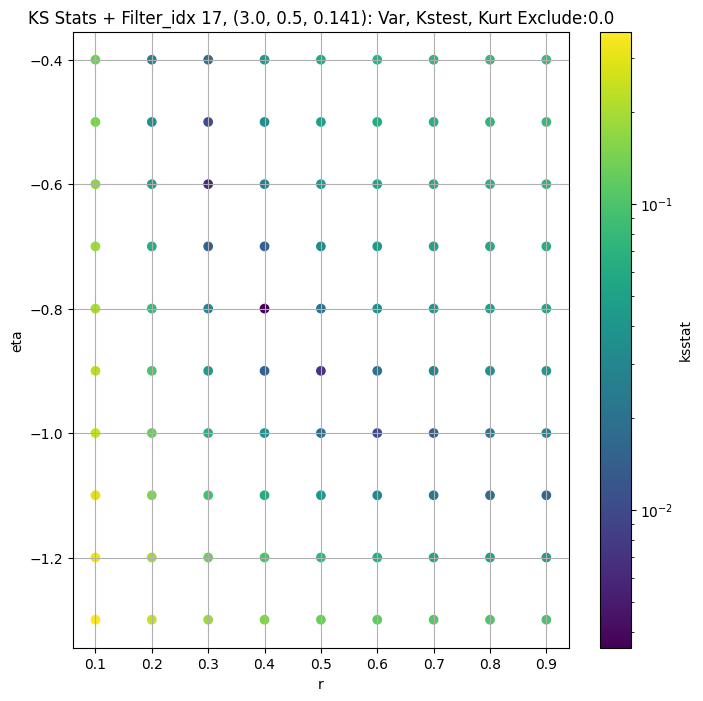

####
Filter_idx, 18: (3.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 0 0.004553984250835724 1859.5559532755885


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 50 0.0062946424543398605 1720.0086755867624


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 100 0.0074293502754857466 1646.4818533852797


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 200 0.007956178956718851 1538.4542140851318
Number of samples: 100000, Without approximation : 786432000.0


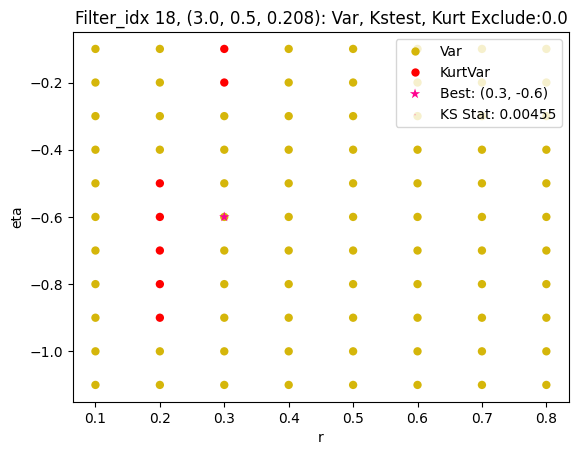

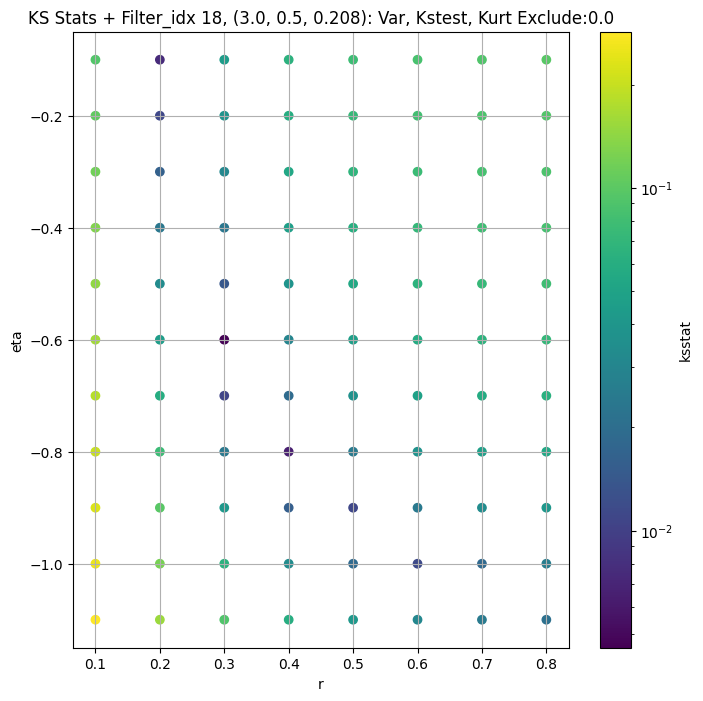

####
Filter_idx, 19: (3.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 0 0.0060889019208836825 498.5214776849616


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 50 0.0065720341837609 452.14929048685445


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 100 0.005086843460672563 429.0210113502621


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 200 0.007818320476139617 396.08643315917294
Number of samples: 100000, Without approximation : 786432000.0


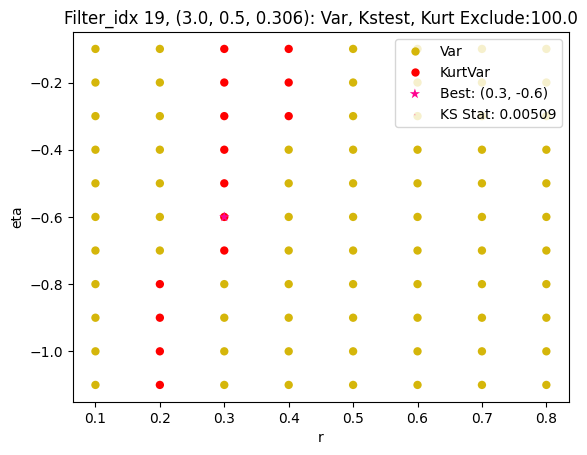

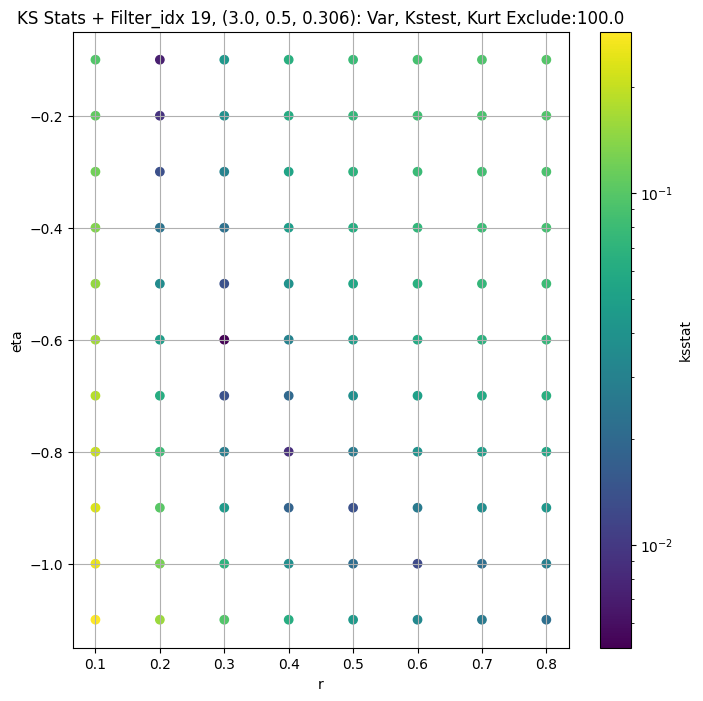

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,initial_r,initial_eta,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05
filter_idx,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",82714.227802,65332.828392,101670.798673,4.835839,2.616254,11.097661,786432000.0,"(2.0, 0.5, 0.044)",0.004406,0.8,-0.9,100000.000000,0.0,82714.227802,0.000048
1,"(2.0, 0.5, 0.065)",23392.376059,18653.036103,29341.232192,5.260869,2.674575,14.926199,786432000.0,"(2.0, 0.5, 0.065)",0.004724,0.8,-0.9,27545.455915,50.0,22478.440076,0.000048
2,"(2.0, 0.5, 0.096)",6157.994304,4900.891337,7691.819574,6.138149,3.006038,22.037119,786432000.0,"(2.0, 0.5, 0.096)",0.004837,0.7,-0.9,5635.223161,50.0,5895.388471,0.000048
3,"(2.0, 0.5, 0.141)",1691.274631,1308.193699,2148.475904,7.471019,3.699209,22.976694,786432000.0,"(2.0, 0.5, 0.141)",0.006375,0.6,-0.9,1036.462329,100.0,1559.435815,0.000048
4,"(2.0, 0.5, 0.208)",403.765609,301.934089,516.153452,9.585465,4.791787,33.305756,786432000.0,"(2.0, 0.5, 0.208)",0.006088,0.3,-0.5,2.883353,0.0,403.765609,0.000048
5,"(2.0, 0.5, 0.306)",110852.005620,87987.228134,138799.457603,6.427257,2.552370,21.803500,786432000.0,"(2.0, 0.5, 0.306)",0.004214,0.7,-0.8,83360.213694,50.0,105519.317964,0.000048
6,"(2.0, 0.5, 0.45)",30341.331809,23706.929418,38750.195564,6.600692,3.268219,22.201661,786432000.0,"(2.0, 0.5, 0.45)",0.002917,0.7,-0.9,29002.359483,0.0,30341.331809,0.000048
7,"(2.0, 1.0, 0.044)",8126.168986,6407.307568,10651.946921,7.818029,3.648606,34.370055,786432000.0,"(2.0, 1.0, 0.044)",0.004219,0.4,-0.6,555.098274,0.0,8126.168986,0.000048
8,"(2.0, 1.0, 0.065)",2232.110624,1691.369525,3017.172276,9.292237,3.960677,39.671193,786432000.0,"(2.0, 1.0, 0.065)",0.004417,0.4,-0.7,191.898448,0.0,2232.110624,0.000048


In [12]:
master_df_combo_path = Path(os.path.join(CWD, "CSVs", "master_df_combo.csv"))
rEtaKsstats_dict_path = Path(os.path.join(CWD, "cache", "rEtaKsstats_dict.pickle"))

rEtaKsstats_dict = dict()

if RERUN or not master_df_combo_path.exists():
    sorted_params = sorted(all_cdfs)
    ksstats_dict = dict()

    for i, group in enumerate(GROUPS): # TODO For quick testing purposes
        print(f"####\n{GROUP.capitalize()}, {group}: {str(filter_group_map[group])}")
        sample = group_data_map[group]
        if len(sample) == 0:
            continue
        group_cdfs_df = all_cdfs_df.copy()
        master_df.loc[group, 'kstest_stat_initial'] = 1

        for j in range(len(EXCLUDE_CUTOFFS)):

            exclude_cutoff = EXCLUDE_CUTOFFS[j]
            exclude_cutoff = int(exclude_cutoff)

            if exclude_cutoff == 0:
                augmented_var = np.var(group_data_map[group]) 
            else:
                augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])
                if augmented_var == np.var(group_data_map[group]):
                    continue 
                
            group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
            ksstats, initial_param, min_stat = gridsearch(sample, all_cdfs, debug=True, scales=group_cdfs_df['scale'])
            augmented_var_df.loc[group, f"kstest_stat_{exclude_cutoff}"] = min_stat
            group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] = ksstats
            
            print(group, exclude_cutoff, min_stat, augmented_var)
            
            if (min_stat < master_df.loc[group, 'kstest_stat_initial']) and not np.isclose(min_stat, master_df.loc[group, 'kstest_stat_initial'], 1e-6):
                inital_min_stat = min_stat
                inital_best_param = initial_param
                master_df.loc[group, 'kstest_stat_initial'] = min_stat
                initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                master_df.loc[group, 'initial_r'], master_df.loc[group, 'initial_eta'] = initial_param
                master_df.loc[group, 'initial_scale'] = initial_scale
                master_df.loc[group, 'initial_exclude_cutoff'] = exclude_cutoff
                master_df.loc[group, 'best_augmented_var'] = augmented_var
        
        ksstats = group_cdfs_df[f"ksstat_exclude_{int(master_df.loc[group, 'initial_exclude_cutoff'])}"]
            
        print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
        
        cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
        master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

        best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

        group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
        group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

        group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

        group_dict = {'r' : group_cdfs_df['r'], 'eta' : group_cdfs_df['eta']}
        group_dict.update({f'ksstat_exclude_{exclude_cutoff}' : group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] for exclude_cutoff in EXCLUDE_CUTOFFS[:j+1]})
        rEtaKsstats_dict[group] = group_dict

        cols = ['pass_var', 'pass_kstest', 'pass_kurt']

        fig = combo_test_plot(group_cdfs_df, cols, 
                            plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: {', '.join([col[5:].capitalize() for col in cols])} Exclude:{master_df.loc[group, 'initial_exclude_cutoff']}", 
                            target_var = None,
                            best_param = inital_best_param,
                            best_ksstat=inital_min_stat
                            )
        
        fig.figure.savefig(os.path.join(CWD, "plots", f"full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)

        # Optional: 
        # Create plots of bootstrapped variance and kurtosis for varying confidence intervals
        # fig_var = create_ci_scatter_plot(group_cdfs_df, var_values_dict, metric='variance', group=group)
        # fig_kurt = create_ci_scatter_plot(group_cdfs_df, kurt_values_dict, metric='kurtosis', group=group)

        # fig_var.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_var)
        # fig_kurt.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_kurt)

    # new: add parameter information
    master_df.insert(0, 'params', master_df.index.map(filter_group_map))

    master_df.to_csv(master_df_combo_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)
    augmented_var_df.to_csv(augmented_var_df_path)

augmented_var_df = pd.read_csv(augmented_var_df_path, index_col=GROUP)
master_df = pd.read_csv(master_df_combo_path, index_col=GROUP)
rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df

## Optimization

In [13]:
master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
master_df[f'best_r'] = master_df['initial_r']
master_df[f'best_eta'] = master_df['initial_eta']
master_df[f'best_scale'] = master_df['initial_scale']
master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

Filter_idx 0, (2.0, 0.5, 0.044):


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 0, 0.0 + 100 = 100, ksstat: 0.006232880675040908, var: 77626.48818495999


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 0, 0.0 + 75 = 75, ksstat: 0.0056922343715739565, var: 78583.56921496002


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 0, 0.0 + 50 = 50, ksstat: 0.005236714571668077, var: 79650.39493795564


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 0, 0.0 + 25 = 25, ksstat: 0.004535146001714674, var: 80898.11278378105


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 0, 0.0 + 0 = 0, ksstat: 0.0037801429944430698, var: 82714.22780188349
Number of samples: 100000, Without approximation : 786432000.0


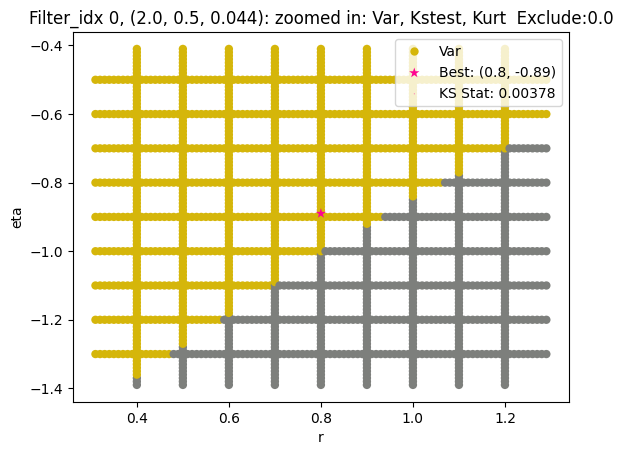

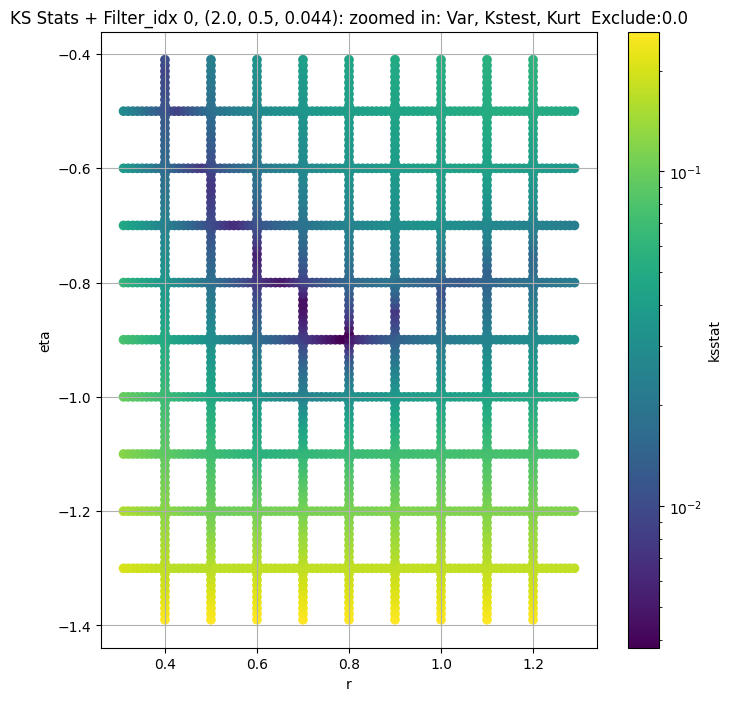

Filter_idx 1, (2.0, 0.5, 0.065):


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 1, 50.0 + 100 = 150, ksstat: 0.005312337722675697, var: 21385.921613379276


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 1, 50.0 + 75 = 125, ksstat: 0.005190297960159573, var: 21625.636013161926


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 1, 50.0 + 50 = 100, ksstat: 0.004687697867383989, var: 21883.29548925212


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 1, 50.0 + 25 = 75, ksstat: 0.004647989544668607, var: 22164.344342185632


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 1, 50.0 + 0 = 50, ksstat: 0.004391920180445985, var: 22478.440076070954


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 1, 50.0 + -25 = 25, ksstat: 0.003954028199430137, var: 22846.641113515074


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 1, 50.0 + -50 = 0, ksstat: 0.0036038374919987737, var: 23392.376058564598
Number of samples: 100000, Without approximation : 786432000.0


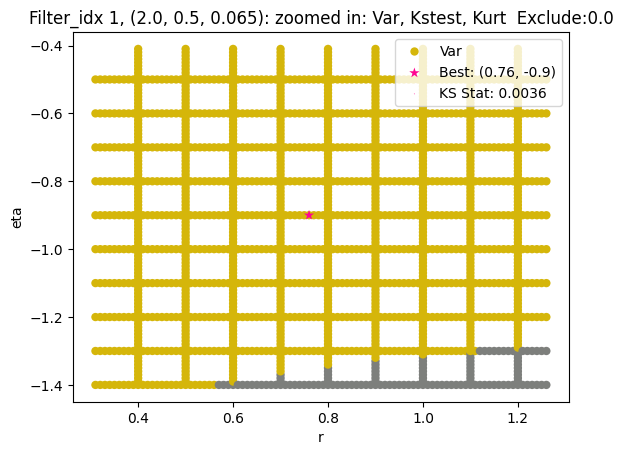

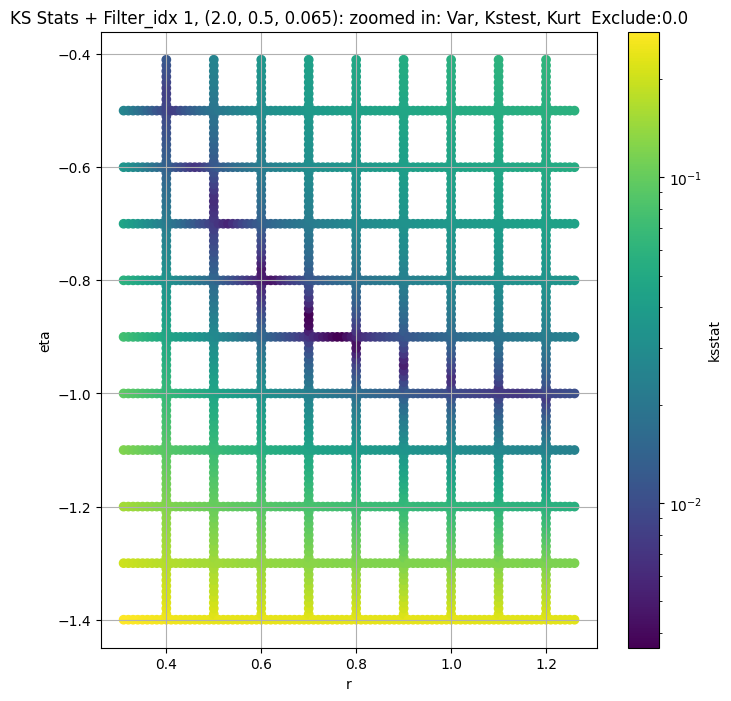

Filter_idx 2, (2.0, 0.5, 0.096):


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 2, 50.0 + 100 = 150, ksstat: 0.00597453383056179, var: 5590.162664490798


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 2, 50.0 + 75 = 125, ksstat: 0.005725641543450233, var: 5657.08078202095


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 2, 50.0 + 50 = 100, ksstat: 0.005229256338912802, var: 5729.028455330964


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 2, 50.0 + 25 = 75, ksstat: 0.005245506959015933, var: 5807.556277119513


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 2, 50.0 + 0 = 50, ksstat: 0.004694069870185613, var: 5895.3884710888215


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 2, 50.0 + -25 = 25, ksstat: 0.004332730900827697, var: 5998.755153620018


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 2, 50.0 + -50 = 0, ksstat: 0.004193833807319969, var: 6157.994303634577
Number of samples: 100000, Without approximation : 786432000.0


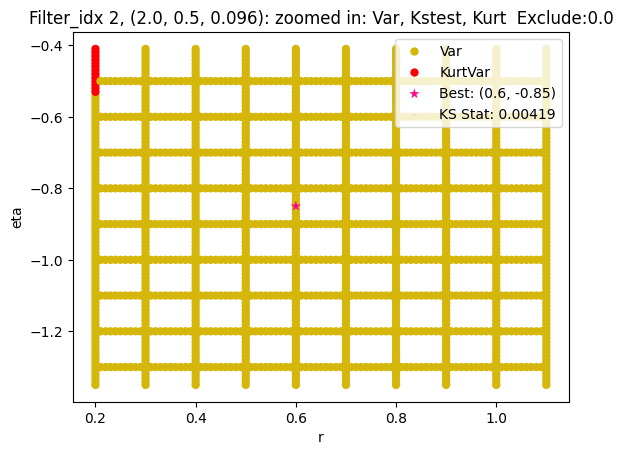

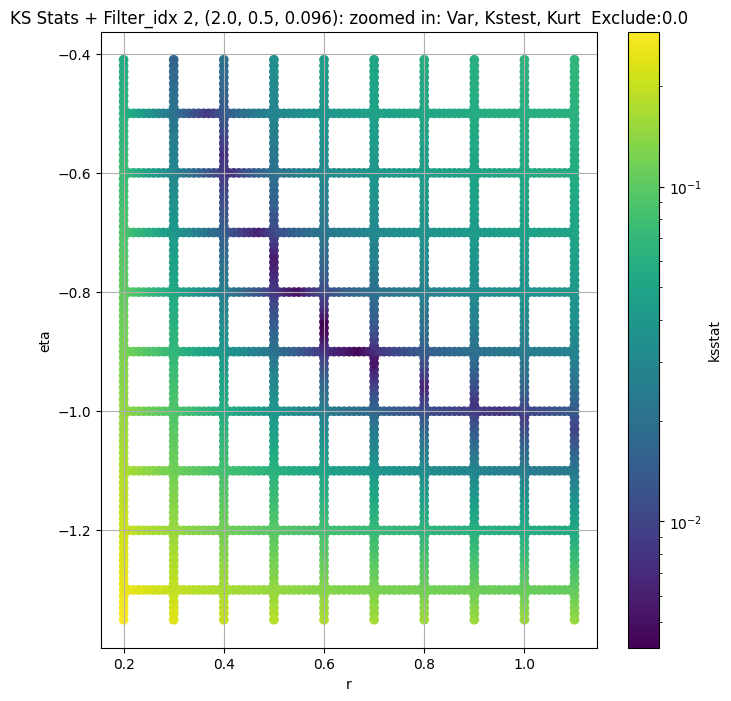

Filter_idx 3, (2.0, 0.5, 0.141):


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 100.0 + 100 = 200, ksstat: 0.007062974768735741, var: 1480.6379233686046


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 100.0 + 75 = 175, ksstat: 0.0068867165773398575, var: 1498.5100618036656


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 100.0 + 50 = 150, ksstat: 0.006689891719737107, var: 1517.4391024509378


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 100.0 + 25 = 125, ksstat: 0.0062861193323136, var: 1537.644333308204


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 100.0 + 0 = 100, ksstat: 0.005948066124714879, var: 1559.4358148847648


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 100.0 + -25 = 75, ksstat: 0.0061104810620367656, var: 1583.3078770817133


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 100.0 + -50 = 50, ksstat: 0.006236895143779342, var: 1610.1307722220972


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 100.0 + -75 = 25, ksstat: 0.005814663195513603, var: 1641.836111231592


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 100.0 + -100 = 0, ksstat: 0.00536345203041888, var: 1691.2746308429878
Number of samples: 100000, Without approximation : 786432000.0


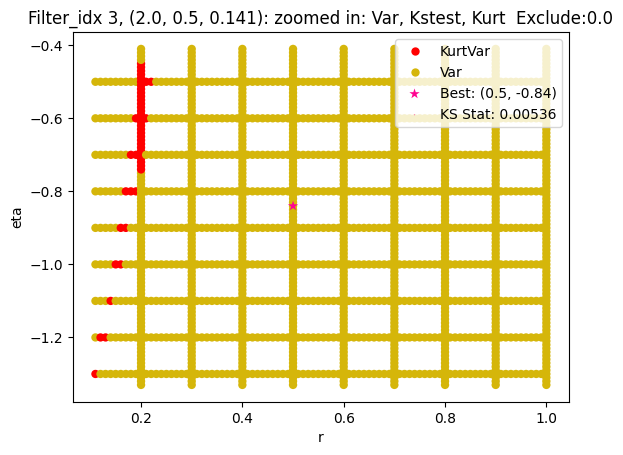

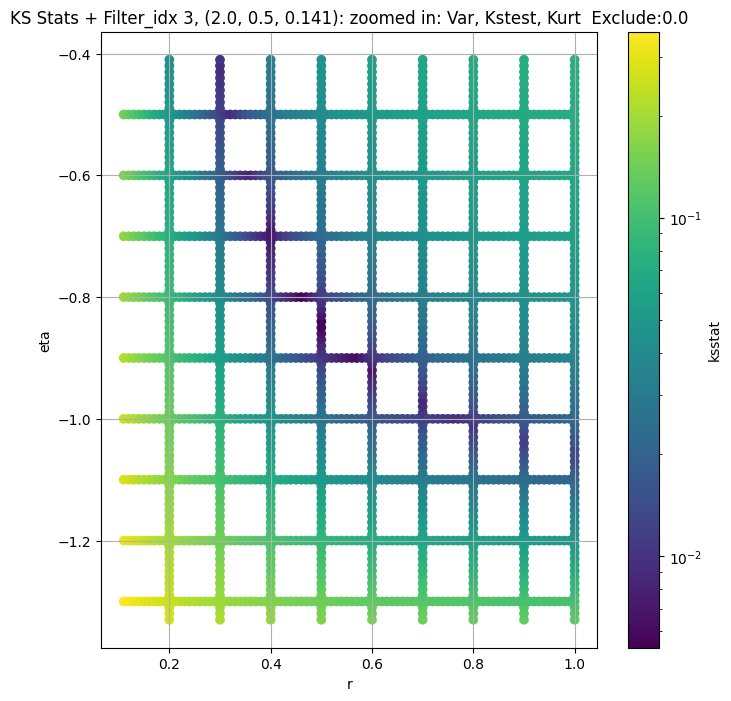

Filter_idx 4, (2.0, 0.5, 0.208):


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 4, 0.0 + 100 = 100, ksstat: 0.006662838823378925, var: 367.1245488976918


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 4, 0.0 + 75 = 75, ksstat: 0.006676533363102477, var: 373.6981891194145


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 4, 0.0 + 50 = 50, ksstat: 0.006280721693651292, var: 381.13311084311437


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 4, 0.0 + 25 = 25, ksstat: 0.005686864037128703, var: 389.97904387267545


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 4, 0.0 + 0 = 0, ksstat: 0.005846117900483283, var: 403.765608970525
Number of samples: 100000, Without approximation : 786432000.0


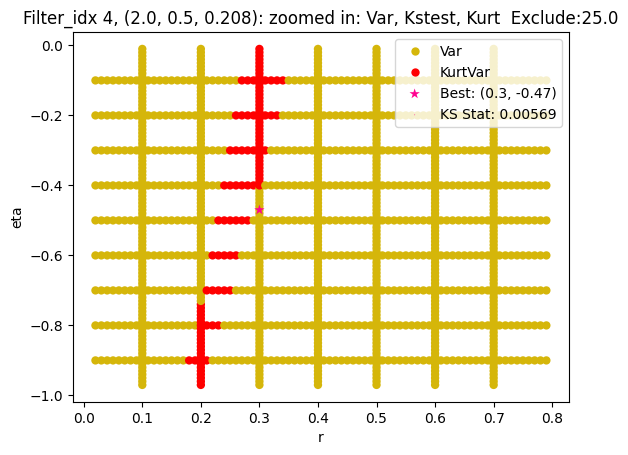

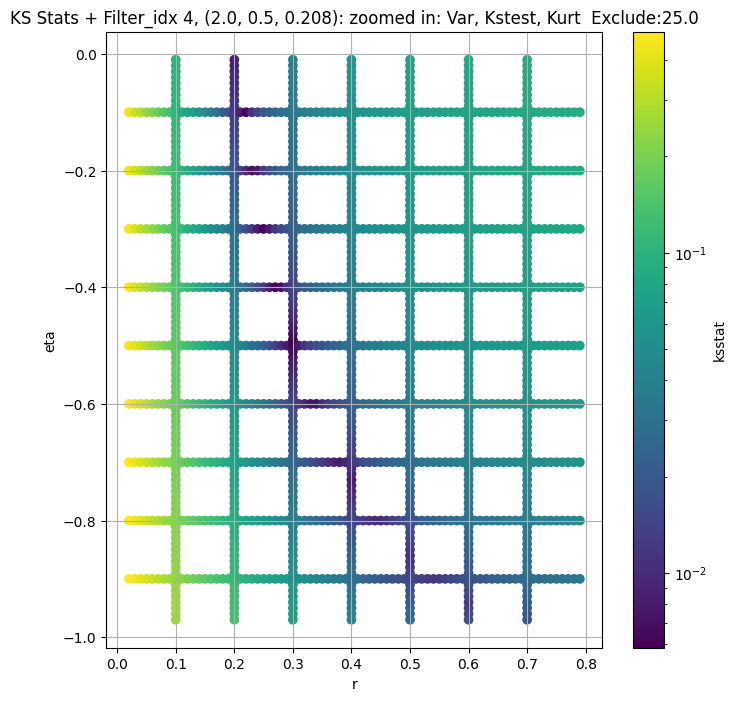

Filter_idx 5, (2.0, 0.5, 0.306):


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 5, 50.0 + 100 = 150, ksstat: 0.005991762539646062, var: 100047.63728599751


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 5, 50.0 + 75 = 125, ksstat: 0.005631600706155204, var: 101233.14686107002


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 5, 50.0 + 50 = 100, ksstat: 0.005117024463955011, var: 102513.60700669764


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 5, 50.0 + 25 = 75, ksstat: 0.0046936395197896275, var: 103921.66900314942


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 5, 50.0 + 0 = 50, ksstat: 0.004213919167628588, var: 105519.31796410758


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 5, 50.0 + -25 = 25, ksstat: 0.003498562517525561, var: 107462.97061914325


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 5, 50.0 + -50 = 0, ksstat: 0.002221365534696318, var: 110852.00561993424
Number of samples: 100000, Without approximation : 786432000.0


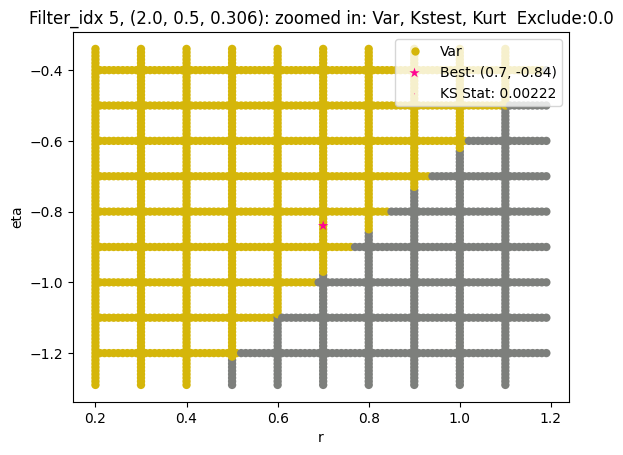

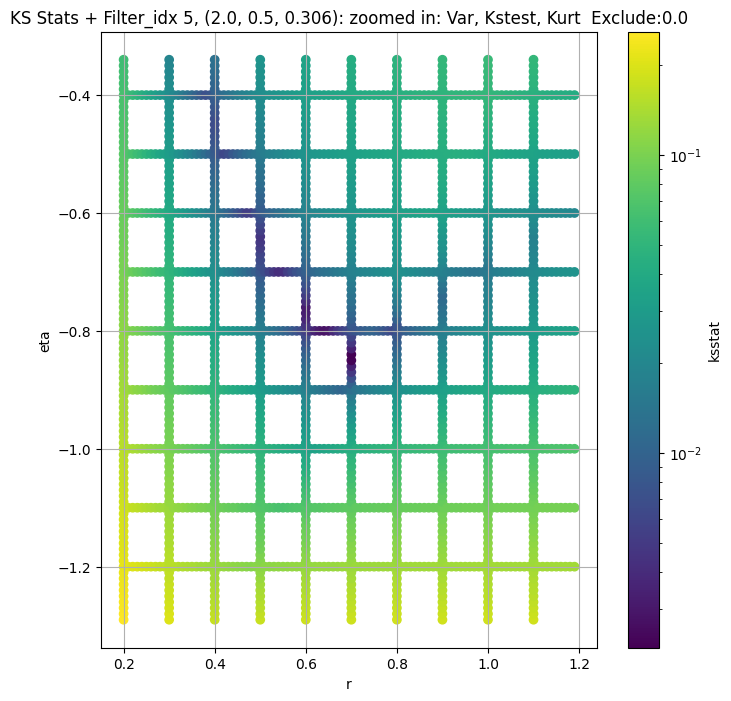

Filter_idx 6, (2.0, 0.5, 0.45):


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 6, 0.0 + 100 = 100, ksstat: 0.003612113743869827, var: 28095.831718498463


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 6, 0.0 + 75 = 75, ksstat: 0.003475177691069753, var: 28499.30660400069


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 6, 0.0 + 50 = 50, ksstat: 0.0030235420761398624, var: 28952.746786521177


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 6, 0.0 + 25 = 25, ksstat: 0.0025961897567635672, var: 29489.54186588748


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 6, 0.0 + 0 = 0, ksstat: 0.0024447643862742785, var: 30341.331808727547
Number of samples: 100000, Without approximation : 786432000.0


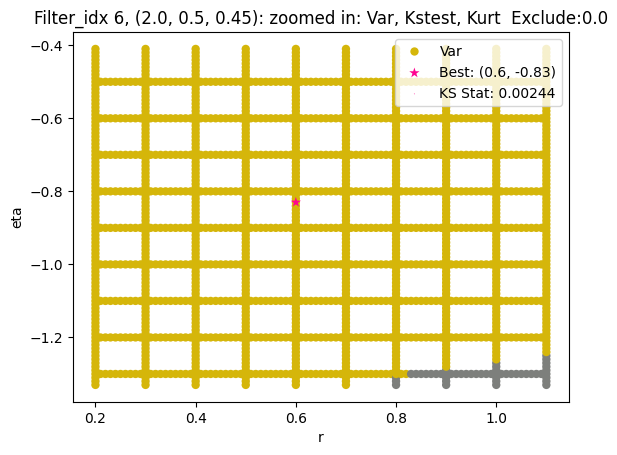

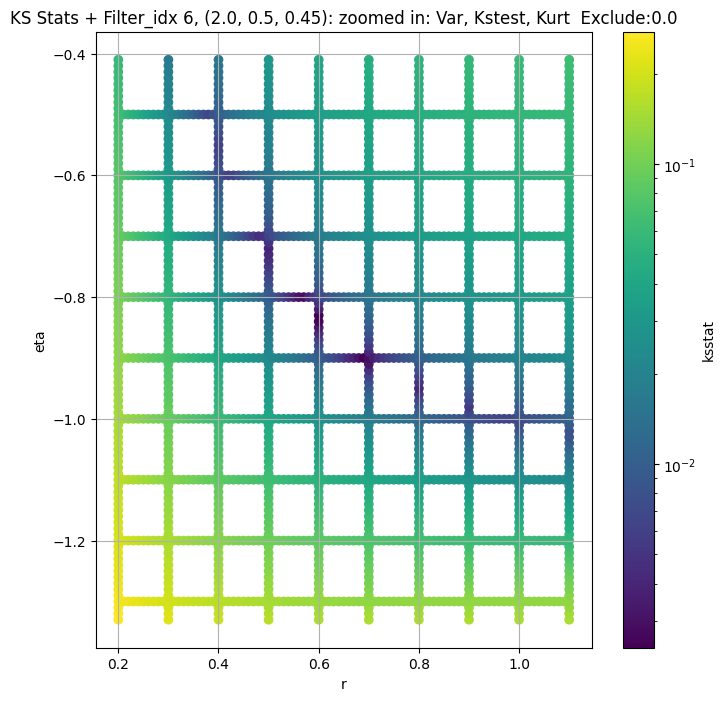

Filter_idx 7, (2.0, 1.0, 0.044):


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 7, 0.0 + 100 = 100, ksstat: 0.00401892416195937, var: 7465.587411191727


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 7, 0.0 + 75 = 75, ksstat: 0.004022134851006998, var: 7580.846048469333


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 7, 0.0 + 50 = 50, ksstat: 0.0034440364834184, var: 7711.15040848898


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 7, 0.0 + 25 = 25, ksstat: 0.0031418257659635573, var: 7867.224979101351


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 7, 0.0 + 0 = 0, ksstat: 0.002421080967219935, var: 8126.168986454247
Number of samples: 100000, Without approximation : 786432000.0


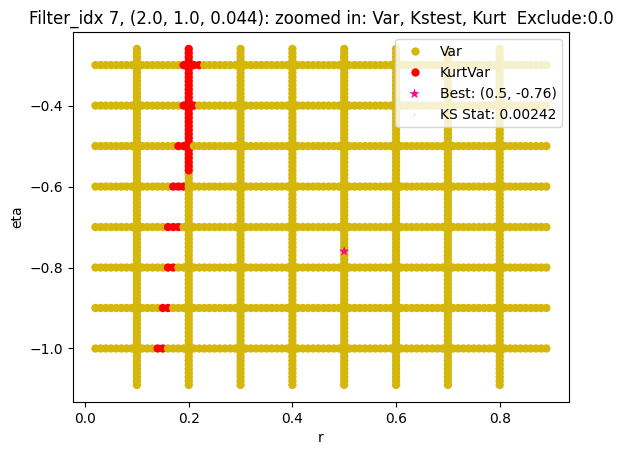

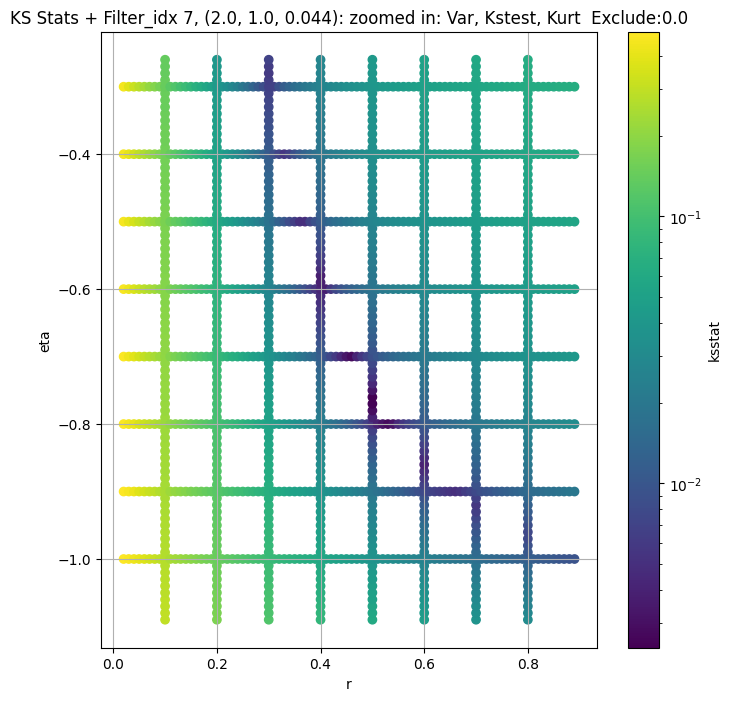

Filter_idx 8, (2.0, 1.0, 0.065):


  0%|          | 0/1600 [00:00<?, ?it/s]

Finding Minimum after computing 1600 CDFs
filter_idx 8, 0.0 + 100 = 100, ksstat: 0.005191373753876349, var: 2031.9153781977373


  0%|          | 0/1600 [00:00<?, ?it/s]

Finding Minimum after computing 1600 CDFs
filter_idx 8, 0.0 + 75 = 75, ksstat: 0.00477235213510499, var: 2066.5812329627


  0%|          | 0/1600 [00:00<?, ?it/s]

Finding Minimum after computing 1600 CDFs
filter_idx 8, 0.0 + 50 = 50, ksstat: 0.004014589846015104, var: 2105.9657157493334


  0%|          | 0/1600 [00:00<?, ?it/s]

Finding Minimum after computing 1600 CDFs
filter_idx 8, 0.0 + 25 = 25, ksstat: 0.003906859908358817, var: 2153.2732616698167


  0%|          | 0/1600 [00:00<?, ?it/s]

Finding Minimum after computing 1600 CDFs
filter_idx 8, 0.0 + 0 = 0, ksstat: 0.004416547391706965, var: 2232.110624370132
Number of samples: 100000, Without approximation : 786432000.0


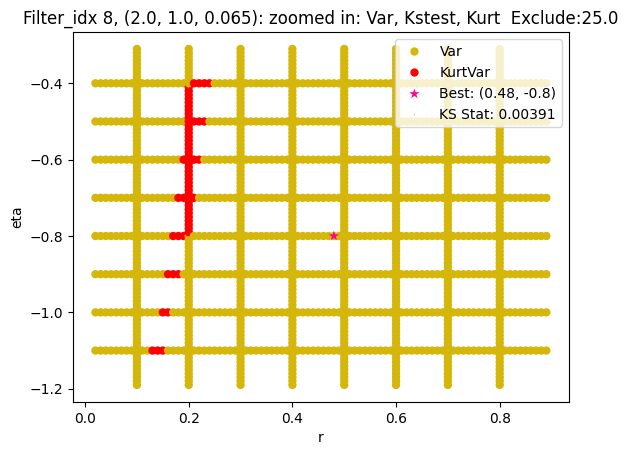

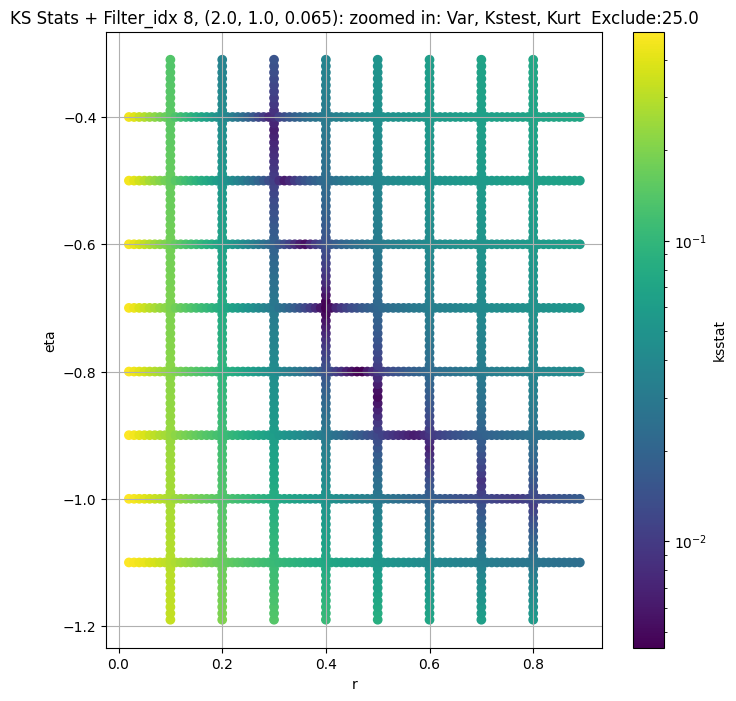

Filter_idx 9, (2.0, 1.0, 0.096):


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 9, 0.0 + 100 = 100, ksstat: 0.005243558473180476, var: 507.39935345634365


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 9, 0.0 + 75 = 75, ksstat: 0.005086228349013344, var: 517.2647803311957


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 9, 0.0 + 50 = 50, ksstat: 0.0046675123635866456, var: 528.5398589832888


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 9, 0.0 + 25 = 25, ksstat: 0.004245139008307586, var: 542.2305912920614


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 9, 0.0 + 0 = 0, ksstat: 0.004442494550974674, var: 565.5642946956925
Number of samples: 100000, Without approximation : 786432000.0


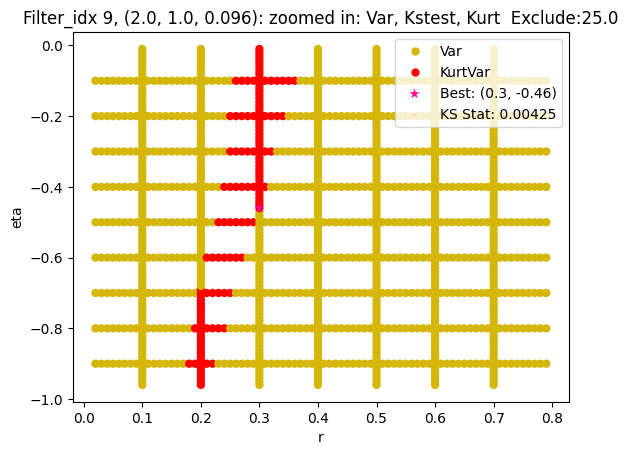

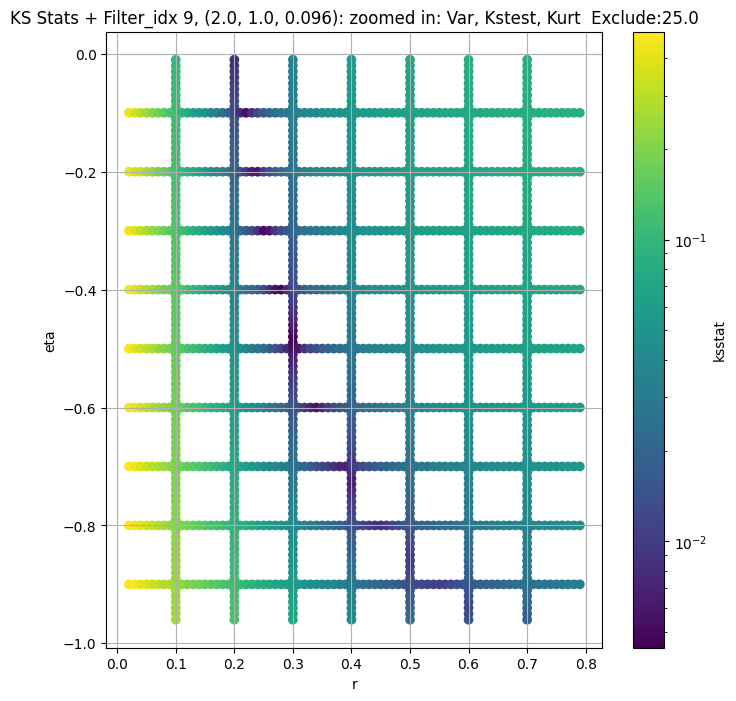

Filter_idx 10, (2.0, 1.0, 0.141):


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 10, 50.0 + 100 = 150, ksstat: 0.005538820390851962, var: 78040.43876886605


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 10, 50.0 + 75 = 125, ksstat: 0.005204502162488467, var: 78998.89971796722


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 10, 50.0 + 50 = 100, ksstat: 0.004829697178533765, var: 80031.93981911521


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 10, 50.0 + 25 = 75, ksstat: 0.004430427769723466, var: 81161.29874659989


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 10, 50.0 + 0 = 50, ksstat: 0.00398822154452716, var: 82425.37638933184


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 10, 50.0 + -25 = 25, ksstat: 0.003428232806148901, var: 83903.08692825054


  0%|          | 0/1900 [00:00<?, ?it/s]

Finding Minimum after computing 1900 CDFs
filter_idx 10, 50.0 + -50 = 0, ksstat: 0.002756607313143422, var: 86145.24942030084
Number of samples: 100000, Without approximation : 786432000.0


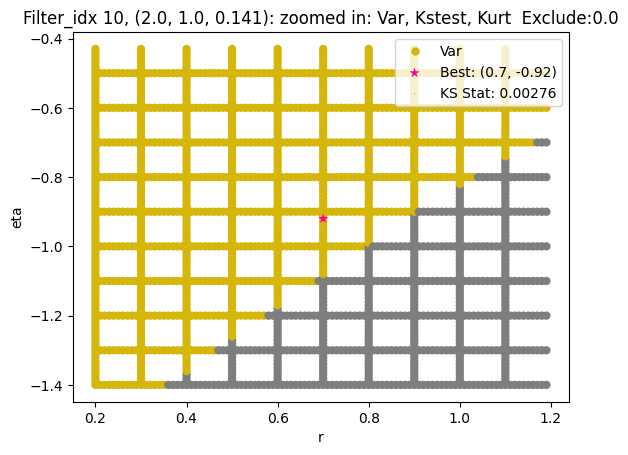

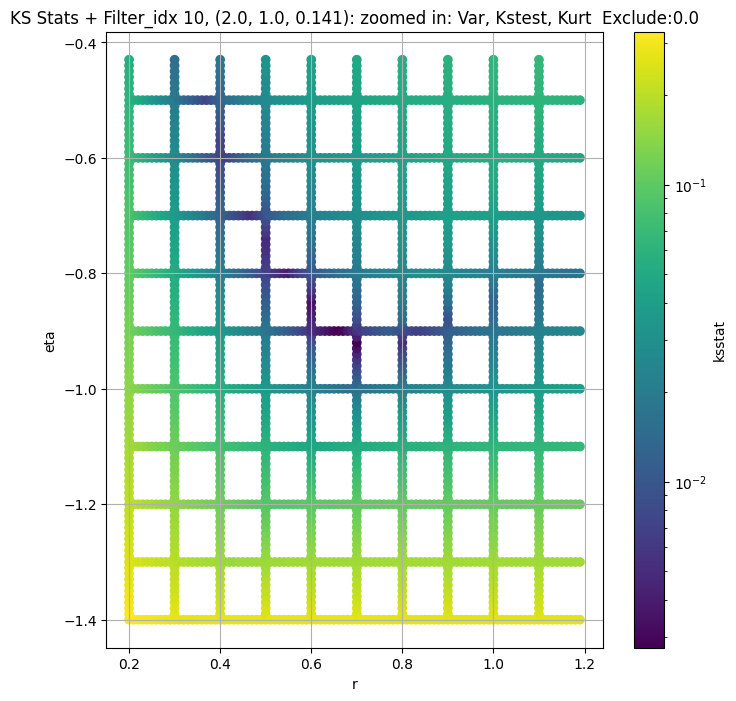

Filter_idx 11, (2.0, 1.0, 0.208):


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 11, 50.0 + 100 = 150, ksstat: 0.0055198610847533094, var: 19541.291246711793


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 11, 50.0 + 75 = 125, ksstat: 0.005334968581178989, var: 19796.995305293247


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 11, 50.0 + 50 = 100, ksstat: 0.005129390708618772, var: 20072.625040686482


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 11, 50.0 + 25 = 75, ksstat: 0.004577736672780719, var: 20374.407163053307


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 11, 50.0 + 0 = 50, ksstat: 0.004347113322472063, var: 20713.41157730476


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 11, 50.0 + -25 = 25, ksstat: 0.004286747215072766, var: 21114.319453253996


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 11, 50.0 + -50 = 0, ksstat: 0.003405770870528624, var: 21748.63805825821
Number of samples: 100000, Without approximation : 786432000.0


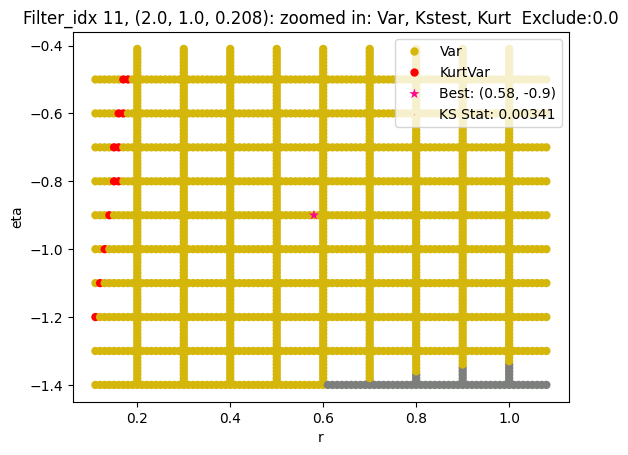

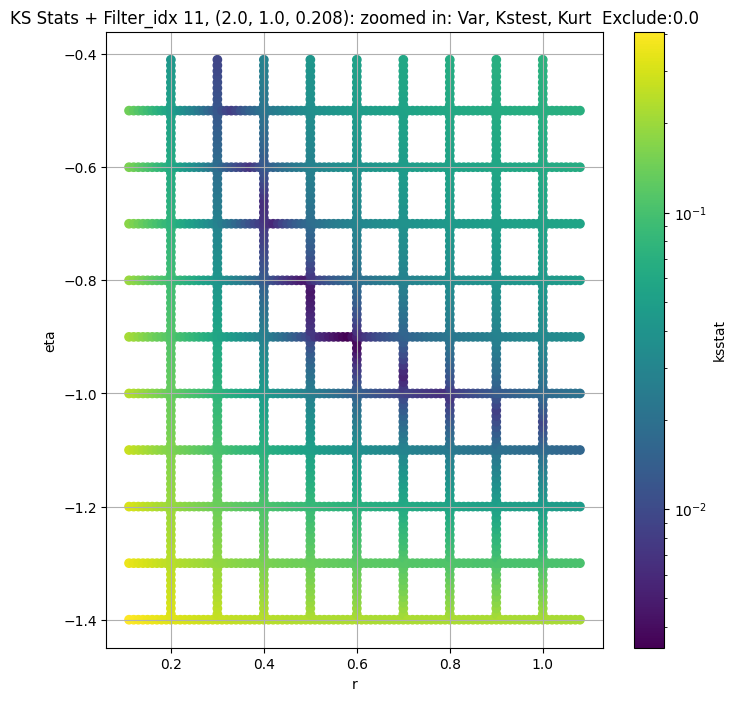

Filter_idx 12, (2.0, 1.0, 0.306):


  0%|          | 0/1790 [00:00<?, ?it/s]

Finding Minimum after computing 1790 CDFs
filter_idx 12, 0.0 + 100 = 100, ksstat: 0.005913095563884974, var: 5573.2972095135665


  0%|          | 0/1790 [00:00<?, ?it/s]

Finding Minimum after computing 1790 CDFs
filter_idx 12, 0.0 + 75 = 75, ksstat: 0.005426575824777284, var: 5662.067876063568


  0%|          | 0/1790 [00:00<?, ?it/s]

Finding Minimum after computing 1790 CDFs
filter_idx 12, 0.0 + 50 = 50, ksstat: 0.004798249174734537, var: 5762.302090142208


  0%|          | 0/1790 [00:00<?, ?it/s]

Finding Minimum after computing 1790 CDFs
filter_idx 12, 0.0 + 25 = 25, ksstat: 0.004873530041075103, var: 5881.810754173482


  0%|          | 0/1790 [00:00<?, ?it/s]

Finding Minimum after computing 1790 CDFs
filter_idx 12, 0.0 + 0 = 0, ksstat: 0.004015385482241729, var: 6076.052420963615
Number of samples: 100000, Without approximation : 786432000.0


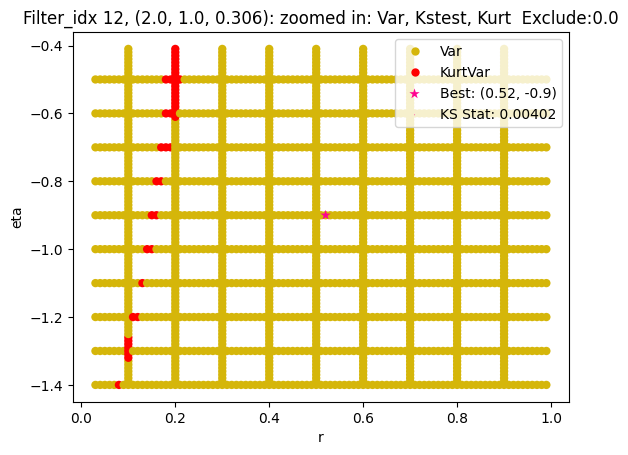

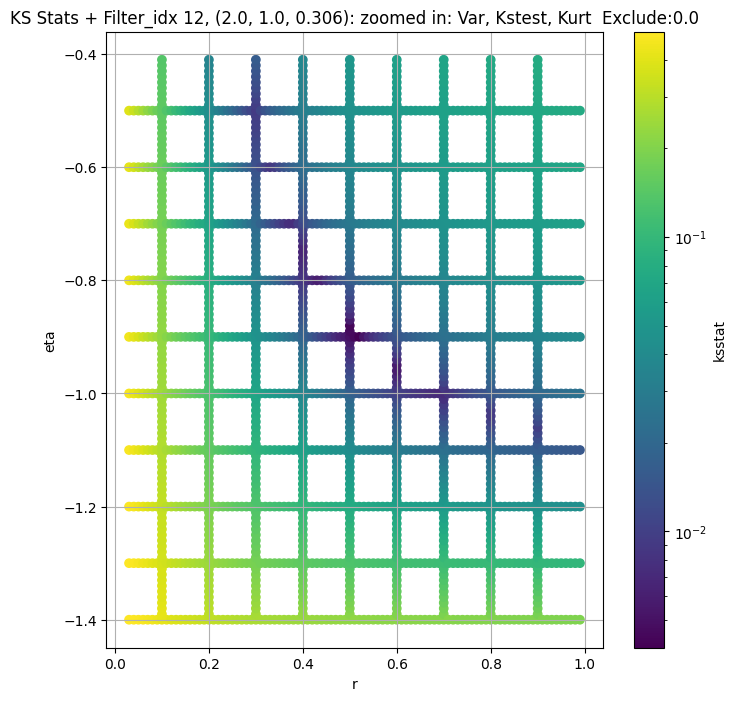

Filter_idx 13, (2.0, 1.0, 0.45):


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 13, 0.0 + 100 = 100, ksstat: 0.006161653624794795, var: 1533.6573470013973


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 13, 0.0 + 75 = 75, ksstat: 0.005816305266632571, var: 1560.6192068547107


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 13, 0.0 + 50 = 50, ksstat: 0.005631287235317695, var: 1591.1978488124798


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 13, 0.0 + 25 = 25, ksstat: 0.005693554915724097, var: 1627.9886398266403


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 13, 0.0 + 0 = 0, ksstat: 0.004841573393420007, var: 1691.2470712563852
Number of samples: 100000, Without approximation : 786432000.0


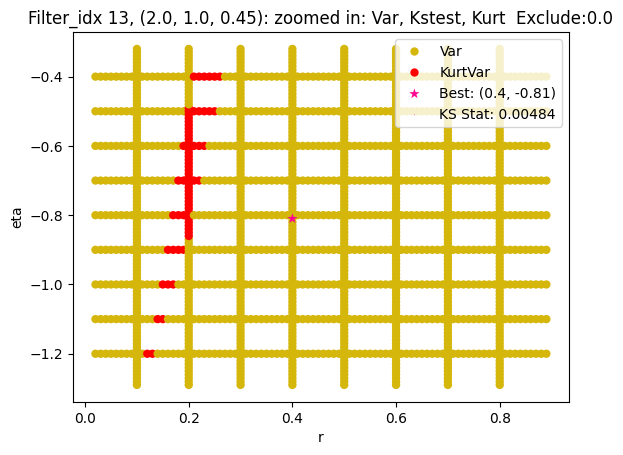

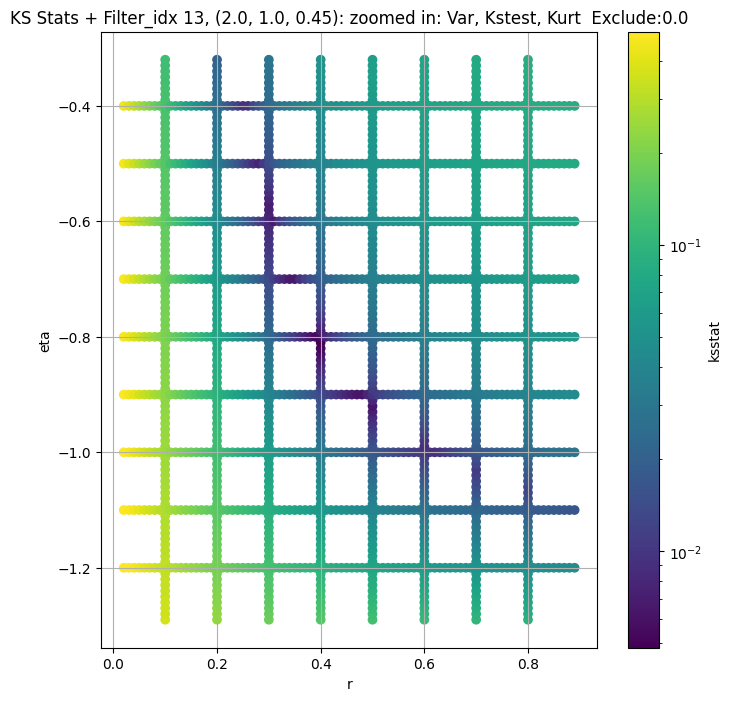

Filter_idx 14, (3.0, 0.5, 0.044):


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 14, 50.0 + 100 = 150, ksstat: 0.006114483094973311, var: 355.1135825163114


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 14, 50.0 + 75 = 125, ksstat: 0.005933661016555791, var: 361.4330110721586


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 14, 50.0 + 50 = 100, ksstat: 0.005836468549763607, var: 368.33735497535633


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 14, 50.0 + 25 = 75, ksstat: 0.0055417820918667315, var: 376.0142760037755


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 14, 50.0 + 0 = 50, ksstat: 0.004993438991950261, var: 384.8064783194706


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 14, 50.0 + -25 = 25, ksstat: 0.004861893632536619, var: 395.4996983781501


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 14, 50.0 + -50 = 0, ksstat: 0.0041875486198309705, var: 414.0813163355717
Number of samples: 100000, Without approximation : 786432000.0


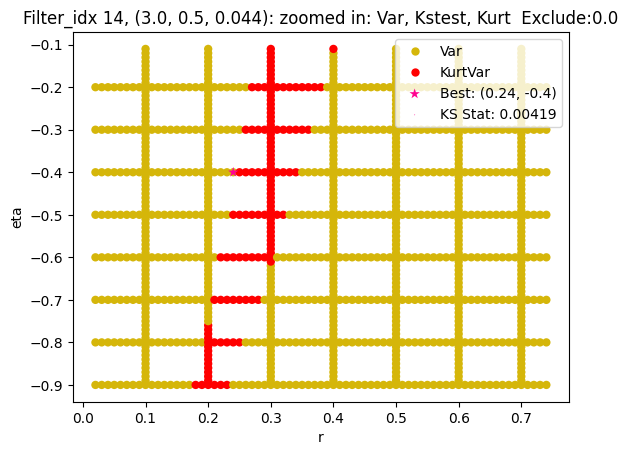

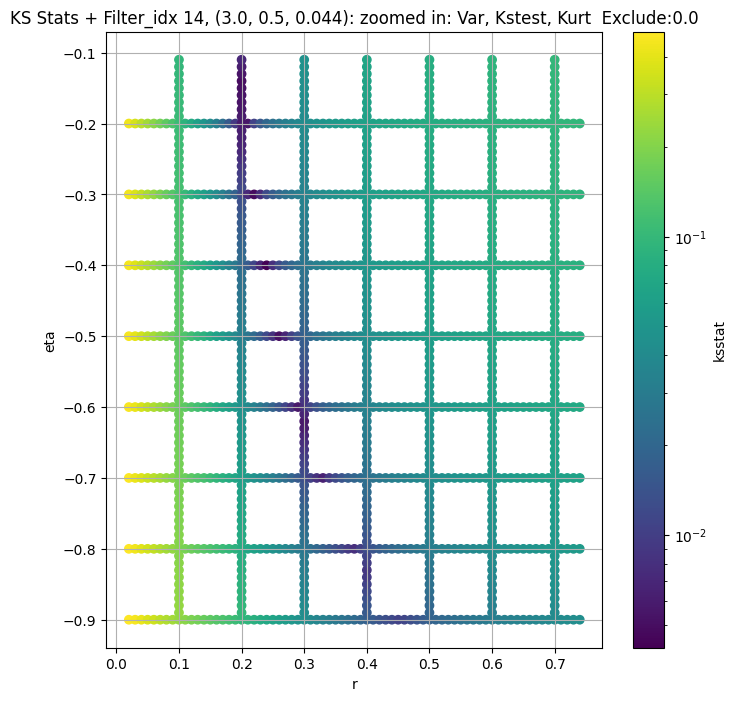

Filter_idx 15, (3.0, 0.5, 0.065):


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 15, 50.0 + 100 = 150, ksstat: 0.004088620398688431, var: 87559.95899397739


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 15, 50.0 + 75 = 125, ksstat: 0.00395678101052277, var: 88922.28839590942


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 15, 50.0 + 50 = 100, ksstat: 0.0035127038837893254, var: 90406.5742495326


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 15, 50.0 + 25 = 75, ksstat: 0.0038182185848540384, var: 92051.04652253319


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 15, 50.0 + 0 = 50, ksstat: 0.0032329604043561666, var: 93928.39398211366


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 15, 50.0 + -25 = 25, ksstat: 0.0026040676757697057, var: 96203.09947475207


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 15, 50.0 + -50 = 0, ksstat: 0.0026741046644321864, var: 100065.78976129922
Number of samples: 100000, Without approximation : 786432000.0


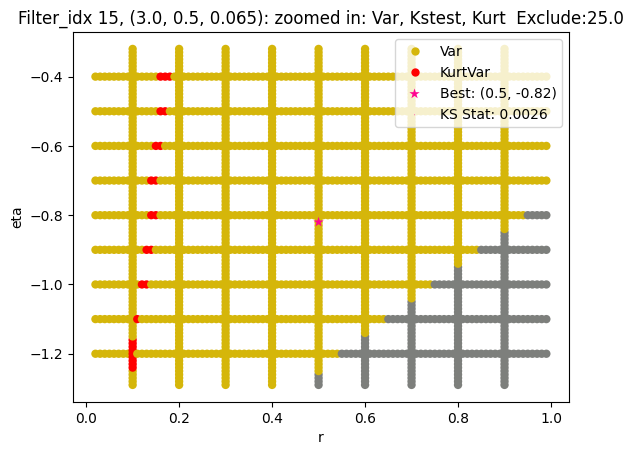

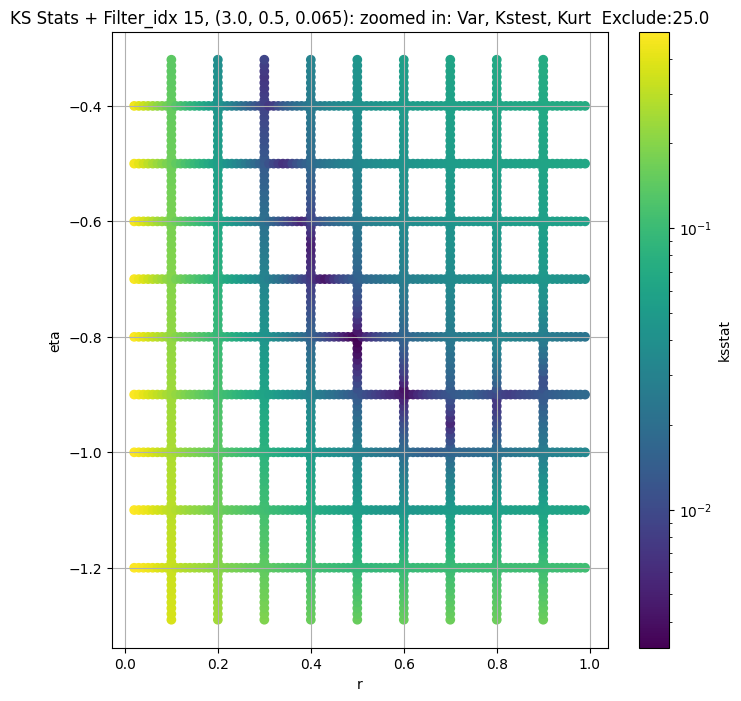

Filter_idx 16, (3.0, 0.5, 0.096):


  0%|          | 0/1600 [00:00<?, ?it/s]

Finding Minimum after computing 1600 CDFs
filter_idx 16, 0.0 + 100 = 100, ksstat: 0.0036514331828688684, var: 23874.930301490032


  0%|          | 0/1600 [00:00<?, ?it/s]

Finding Minimum after computing 1600 CDFs
filter_idx 16, 0.0 + 75 = 75, ksstat: 0.003671689046854887, var: 24321.819895764176


  0%|          | 0/1600 [00:00<?, ?it/s]

Finding Minimum after computing 1600 CDFs
filter_idx 16, 0.0 + 50 = 50, ksstat: 0.0029026316113649475, var: 24834.866081932654


  0%|          | 0/1600 [00:00<?, ?it/s]

Finding Minimum after computing 1600 CDFs
filter_idx 16, 0.0 + 25 = 25, ksstat: 0.0024306966536316033, var: 25461.1777963233


  0%|          | 0/1600 [00:00<?, ?it/s]

Finding Minimum after computing 1600 CDFs
filter_idx 16, 0.0 + 0 = 0, ksstat: 0.00238414665243758, var: 26510.01595439632
Number of samples: 100000, Without approximation : 786432000.0


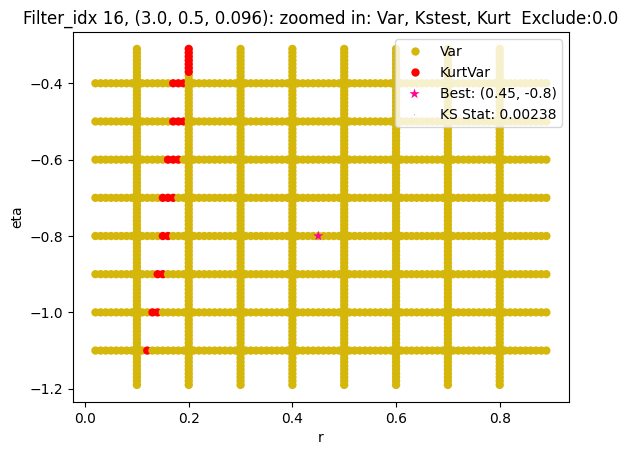

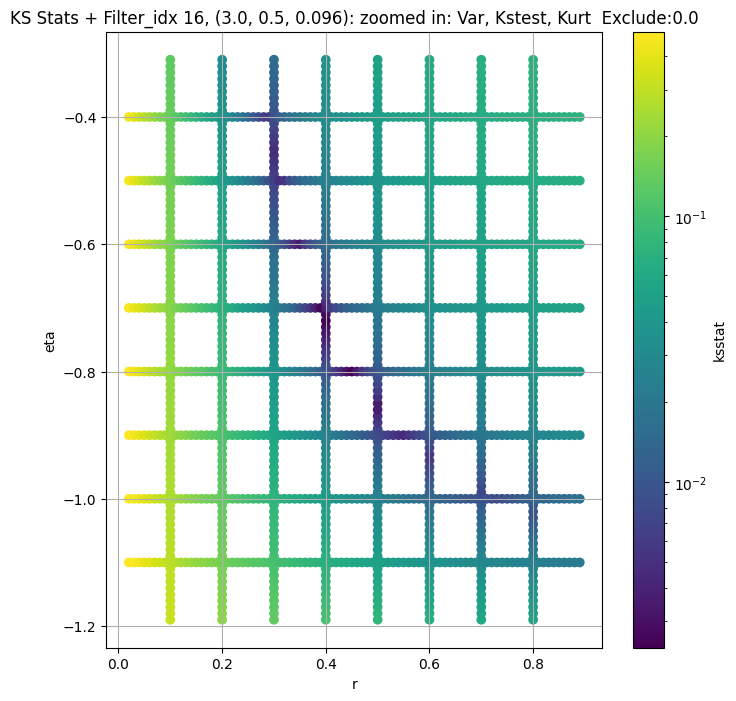

Filter_idx 17, (3.0, 0.5, 0.141):


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 17, 0.0 + 100 = 100, ksstat: 0.004019186100719385, var: 6214.041342024648


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 17, 0.0 + 75 = 75, ksstat: 0.004108346797937958, var: 6339.739359395844


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 17, 0.0 + 50 = 50, ksstat: 0.003576038541908466, var: 6484.40625542368


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 17, 0.0 + 25 = 25, ksstat: 0.0032542229622470886, var: 6661.772788276326


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 17, 0.0 + 0 = 0, ksstat: 0.0029245161044596374, var: 6989.307155123162
Number of samples: 100000, Without approximation : 786432000.0


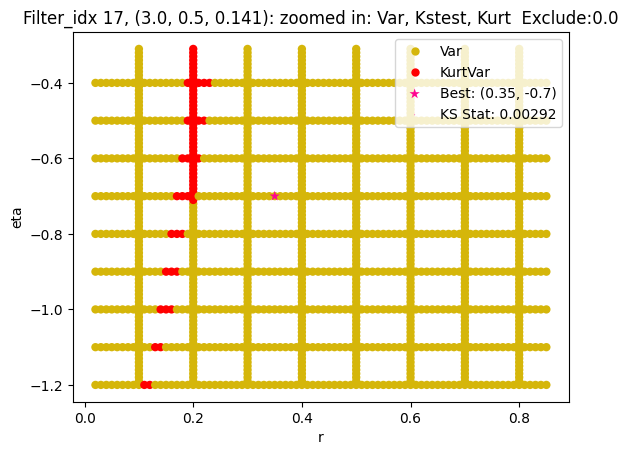

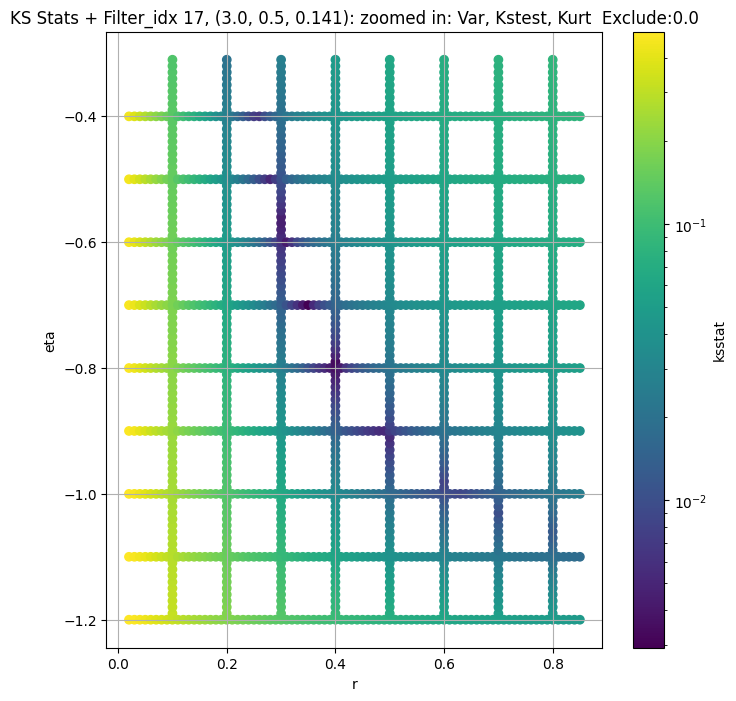

Filter_idx 18, (3.0, 0.5, 0.208):


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 0.0 + 100 = 100, ksstat: 0.005178978993919892, var: 1646.4818533852797


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 0.0 + 75 = 75, ksstat: 0.004964187515481333, var: 1680.6207916791425


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 0.0 + 50 = 50, ksstat: 0.004769231959155351, var: 1720.0086755867624


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 0.0 + 25 = 25, ksstat: 0.004694926032505015, var: 1768.5304834637582


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 0.0 + 0 = 0, ksstat: 0.004180869916737273, var: 1859.5559532755885
Number of samples: 100000, Without approximation : 786432000.0


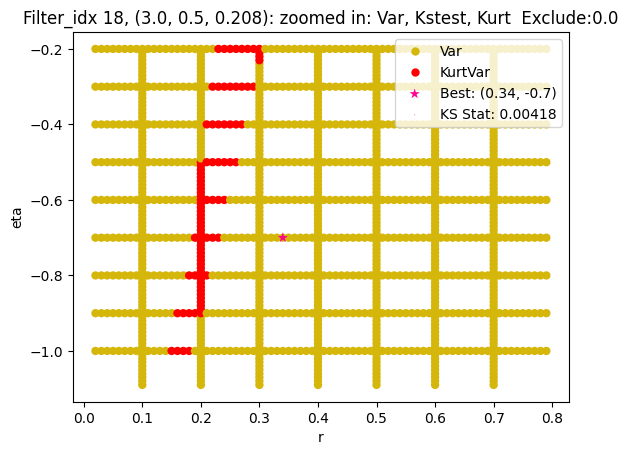

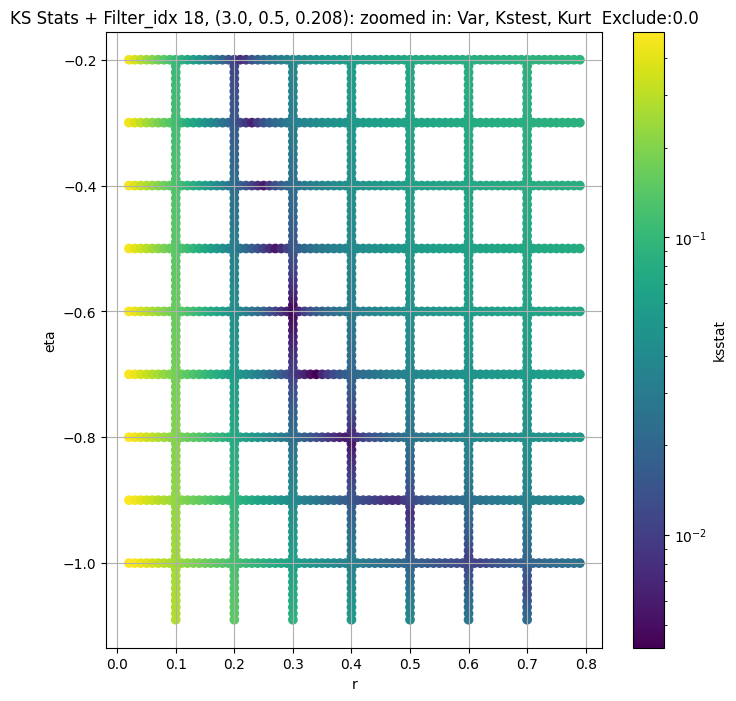

Filter_idx 19, (3.0, 0.5, 0.306):


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 19, 100.0 + 100 = 200, ksstat: 0.005898217420690188, var: 396.08643315917294


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 19, 100.0 + 75 = 175, ksstat: 0.006127906903660184, var: 403.3017563278588


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 19, 100.0 + 50 = 150, ksstat: 0.0054294864210532034, var: 411.0940721904066


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 19, 100.0 + 25 = 125, ksstat: 0.005550166625835323, var: 419.60007315963304


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 19, 100.0 + 0 = 100, ksstat: 0.005036558346708797, var: 429.0210113502621


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 19, 100.0 + -25 = 75, ksstat: 0.004743910403607998, var: 439.6756827628423


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 19, 100.0 + -50 = 50, ksstat: 0.004502873642679005, var: 452.14929048685445


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 19, 100.0 + -75 = 25, ksstat: 0.004532576806427352, var: 467.8067862927309


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 19, 100.0 + -100 = 0, ksstat: 0.0032290577313355204, var: 498.5214776849616
Number of samples: 100000, Without approximation : 786432000.0


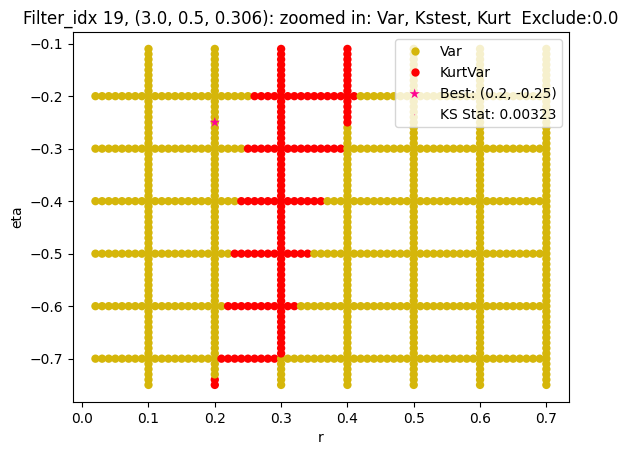

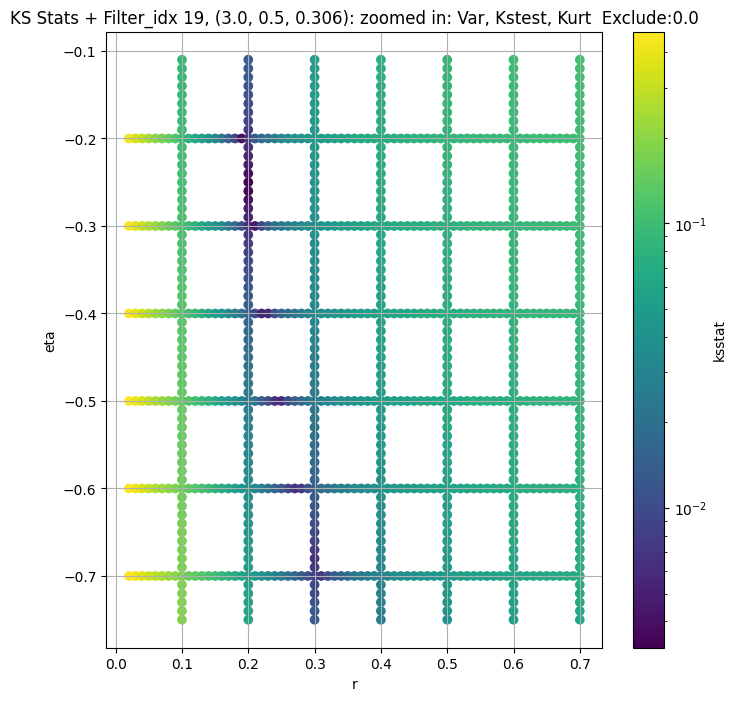

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff,n_pval_0.05
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",82714.227802,65332.828392,101670.798673,4.835839,2.616254,11.097661,786432000.0,"(2.0, 0.5, 0.044)",0.004406,...,100000.000000,0.0,82714.227802,0.000048,0.003780,0.80,-0.89,99480.449584,0.0,136687
1,"(2.0, 0.5, 0.065)",23392.376059,18653.036103,29341.232192,5.260869,2.674575,14.926199,786432000.0,"(2.0, 0.5, 0.065)",0.004724,...,27545.455915,50.0,23392.376059,0.000048,0.003604,0.76,-0.90,26226.111906,0.0,144000
2,"(2.0, 0.5, 0.096)",6157.994304,4900.891337,7691.819574,6.138149,3.006038,22.037119,786432000.0,"(2.0, 0.5, 0.096)",0.004837,...,5635.223161,50.0,6157.994304,0.000048,0.004194,0.60,-0.85,3669.029255,0.0,108000
3,"(2.0, 0.5, 0.141)",1691.274631,1308.193699,2148.475904,7.471019,3.699209,22.976694,786432000.0,"(2.0, 0.5, 0.141)",0.006375,...,1036.462329,100.0,1691.274631,0.000048,0.005363,0.50,-0.84,552.270974,0.0,64870
4,"(2.0, 0.5, 0.208)",403.765609,301.934089,516.153452,9.585465,4.791787,33.305756,786432000.0,"(2.0, 0.5, 0.208)",0.006088,...,2.883353,0.0,389.979044,0.000048,0.005687,0.30,-0.47,2.579933,25.0,57663
5,"(2.0, 0.5, 0.306)",110852.005620,87987.228134,138799.457603,6.427257,2.552370,21.803500,786432000.0,"(2.0, 0.5, 0.306)",0.004214,...,83360.213694,50.0,110852.005620,0.000048,0.002221,0.70,-0.84,94210.051562,0.0,384000
6,"(2.0, 0.5, 0.45)",30341.331809,23706.929418,38750.195564,6.600692,3.268219,22.201661,786432000.0,"(2.0, 0.5, 0.45)",0.002917,...,29002.359483,0.0,30341.331809,0.000048,0.002445,0.60,-0.83,17340.073094,0.0,324000
7,"(2.0, 1.0, 0.044)",8126.168986,6407.307568,10651.946921,7.818029,3.648606,34.370055,786432000.0,"(2.0, 1.0, 0.044)",0.004219,...,555.098274,0.0,8126.168986,0.000048,0.002421,0.50,-0.76,2213.973678,0.0,324000
8,"(2.0, 1.0, 0.065)",2232.110624,1691.369525,3017.172276,9.292237,3.960677,39.671193,786432000.0,"(2.0, 1.0, 0.065)",0.004417,...,191.898448,0.0,2153.273262,0.000048,0.003907,0.48,-0.80,547.870779,25.0,121500


In [14]:
master_df_optimized_path = Path(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))

NUM_ITERS = dict(zip(GROUPS, [1]*len(GROUPS))) # By default, does one iteration per group
NUM_SAMPLES_OPTIMIZE = 2000
EXCLUDE_CUTOFFS_OPTIMIZE = np.arange(100, -101, -25)

if RERUN or not master_df_optimized_path.exists():

    if SKIP_OPTIMIZE_STEP:

        master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
        master_df[f'best_r'] = master_df['initial_r']
        master_df[f'best_eta'] = master_df['initial_eta']
        master_df[f'best_scale'] = master_df['initial_scale']
        master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

    else:
        for group in GROUPS: # TODO For quick testing purposes
            print(f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}:")
            master_df.loc[group, 'kstest_stat_best'] = master_df.loc[group, 'kstest_stat_initial']
            master_df.loc[group, 'best_r'] = master_df.loc[group, 'initial_r']
            master_df.loc[group, 'best_eta'] = master_df.loc[group, 'initial_eta']
            master_df.loc[group, 'best_scale'] = master_df.loc[group, 'initial_scale']

            sample = group_data_map[group]
            if len(sample) == 0:
                continue
            initial_r, initial_eta = master_df.loc[group, 'initial_r'], master_df.loc[group, f'initial_eta']
            eps = 0.5
            group_cdfs_df = fine_cdfs_df[(np.abs(master_df.loc[group, 'initial_r'] - fine_cdfs_df['r']) < eps) & 
                                        (np.abs(master_df.loc[group, 'initial_eta'] - fine_cdfs_df['eta']) < eps)].reset_index(drop=True)
            group_cdfs = {x[0]:x[1] for x in group_cdfs_df['(r,eta),cdf']}

            for adjust_exclude_cutoff in EXCLUDE_CUTOFFS_OPTIMIZE: # -50, -25, 0, 25, 50
                
                exclude_cutoff = int(max(0, adjust_exclude_cutoff + master_df.loc[group, 'initial_exclude_cutoff']))
                
                if exclude_cutoff == 0:
                    augmented_var = np.var(group_data_map[group])
                else:
                    augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])                       

                group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
                ksstats, initial_param, min_stat = gridsearch(sample, group_cdfs, debug=True, scales=group_cdfs_df['scale'])
                
                cutoff_label = generate_cutoff_label(adjust_exclude_cutoff)

                augmented_var_df.loc[group, f"kstest_stat_{cutoff_label}"] = min_stat
                group_cdfs_df[f'ksstat_exclude_{cutoff_label}'] = ksstats
                
                print(f"{GROUP} {group}, {master_df.loc[group, 'initial_exclude_cutoff']} + {adjust_exclude_cutoff} = {exclude_cutoff}, ksstat: {min_stat}, var: {augmented_var}")
                best_adjust = 0

                if min_stat < master_df.loc[group, 'kstest_stat_best']:

                    inital_min_stat = min_stat
                    inital_best_param = initial_param
                    master_df.loc[group, 'kstest_stat_best'] = min_stat
                    initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                    master_df.loc[group, 'best_r'], master_df.loc[group, 'best_eta'] = initial_param
                    master_df.loc[group, 'best_scale'] = initial_scale
                    master_df.loc[group, 'best_exclude_cutoff'] = exclude_cutoff
                    master_df.loc[group, 'best_augmented_var'] = augmented_var
                    augmented_var_df.loc[group, 'best_augmented_var'] = augmented_var
                    best_adjust = adjust_exclude_cutoff

                if exclude_cutoff == 0:
                    break

            cutoff_label = generate_cutoff_label(best_adjust)
            ksstats = group_cdfs_df[f"ksstat_exclude_{cutoff_label}"]
            
            print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
            
            cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
            master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

            best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

            group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
            group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

            group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

            group_dict = rEtaKsstats_dict[group]
            group_dict.update({'r_optimize' : group_cdfs_df['r'], 'eta_optimize' : group_cdfs_df['eta'], f'ksstat_exclude_{cutoff_label}' : ksstats})
            rEtaKsstats_dict[group] = group_dict

            cols = ['pass_var', 'pass_kstest', 'pass_kurt']
            fig = combo_test_plot(group_cdfs_df, cols, 
                                plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: zoomed in: {', '.join([col[5:].capitalize() for col in cols])}  Exclude:{master_df.loc[group, 'best_exclude_cutoff']}",
                                best_param=(master_df.loc[group, 'best_r'], master_df.loc[group, f'best_eta']),
                                best_ksstat=master_df.loc[group, 'kstest_stat_best'])
            fig.figure.savefig(os.path.join(CWD, "plots", f"optimized_full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)
            
    master_df['n_pval_0.05'] = master_df.apply(lambda row : find_n_fixed_pval_stat(row.loc['kstest_stat_best'], row.loc['total_samples']), axis = 1)    
    master_df[['total_samples', 'initial_r', 'initial_eta', 'kstest_stat_initial', 'initial_exclude_cutoff', 'best_r', 'best_eta', 'best_scale', 'kstest_stat_best', 'best_exclude_cutoff', 'n_pval_0.05']].to_csv(os.path.join(CWD, "CSVs", 'optimized_params.csv'))
    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))
    augmented_var_df.to_csv(augmented_var_df_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)

rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df = pd.read_csv(master_df_optimized_path, index_col = GROUP)
augmented_var_df = pd.read_csv(augmented_var_df_path, index_col = GROUP)
master_df

## Comparing Empirical and Computed CDF/PDF

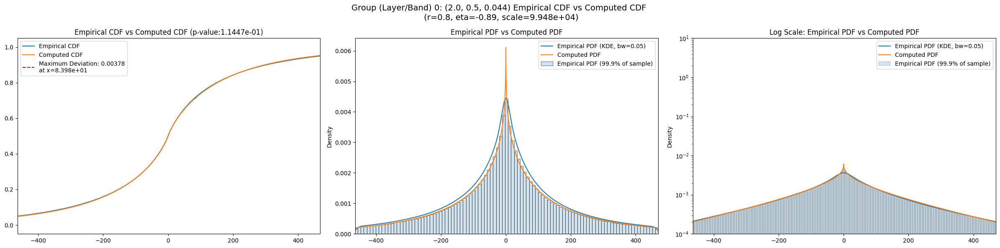

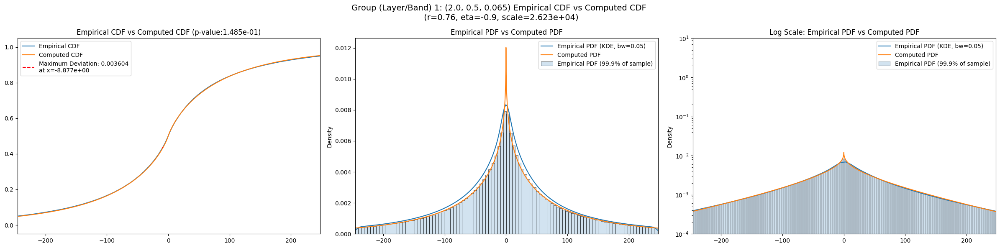

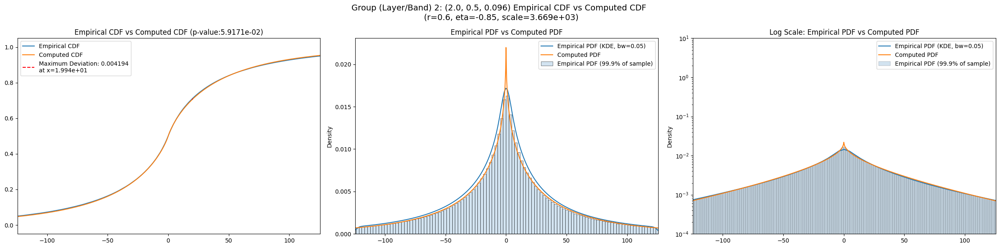

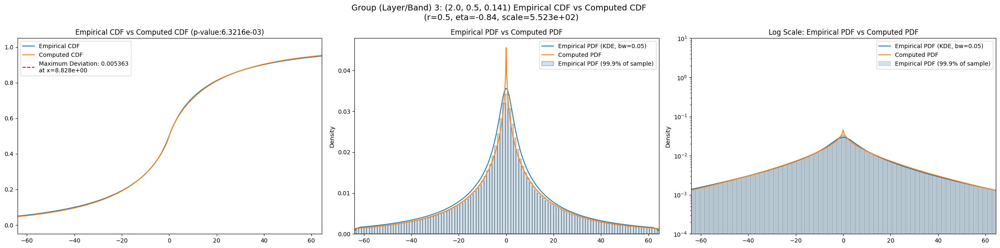

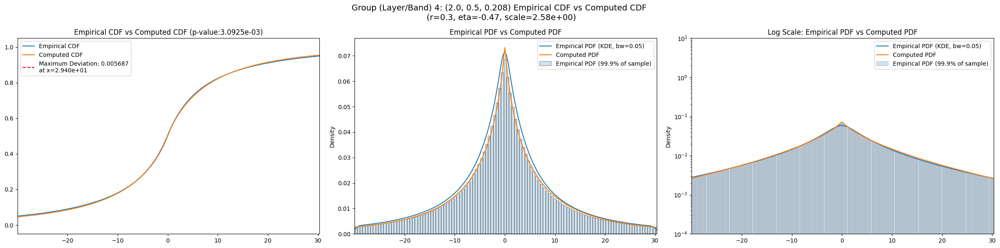

...

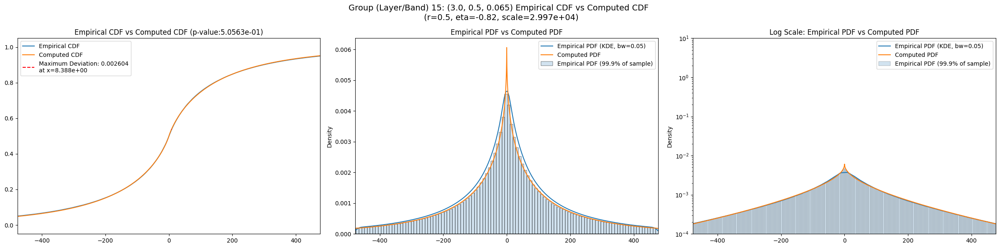

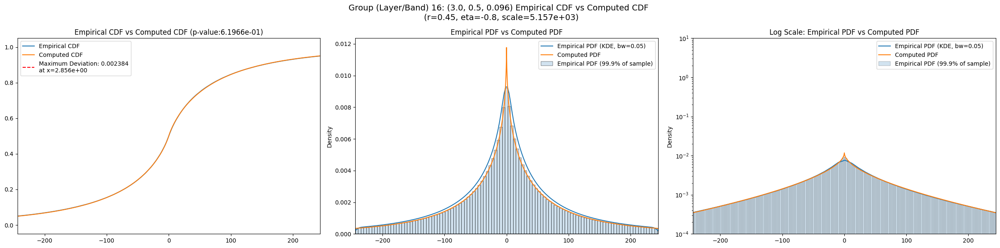

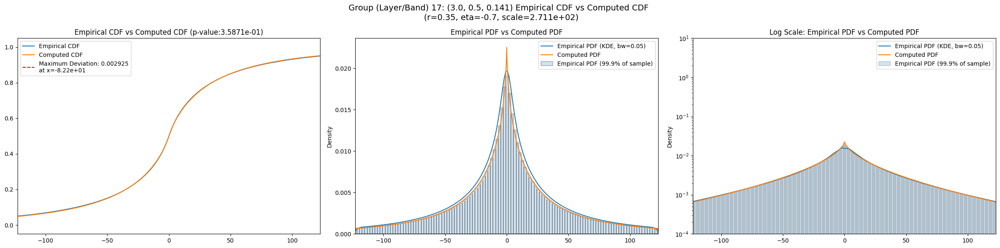

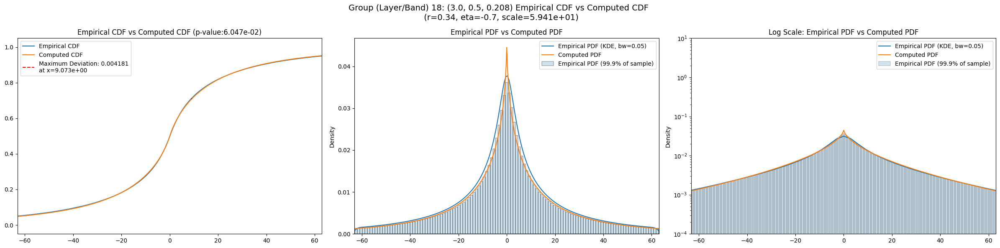

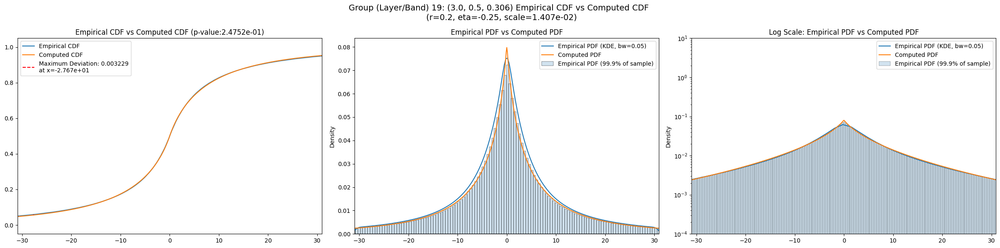

In [15]:
for group in GROUPS:
    group_info = master_df.loc[group]
    best_r = group_info['best_r']
    best_eta = group_info['best_eta']
    best_scale = group_info['best_scale']
    fig = visualize_cdf_pdf(sample = group_data_map[group], 
                    params = (best_r, best_eta, best_scale), 
                    log_scale = True,
                    group = f"{group}: {filter_group_map[group]}")
    fig.savefig(os.path.join(CWD, "plots", f'compare_cdf_pdf_layer_{group}.jpg'), bbox_inches = 'tight', dpi = 100)

## Comparing with Gaussian and Laplace Priors

In [16]:
def generate_func(sample, distro, *args, n_samples=200):
    if distro == 'gaussian' or distro == 'normal':
        def var_func(var):
            cdf = scipy.stats.norm(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'laplace':
        def var_func(var):
            cdf = scipy.stats.laplace(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 't':
        def var_func(var):
            cdf = scipy.stats.t(df=2, scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'prior_r':
        eta = args[0]
        def r_func(r):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return r_func
    elif distro == 'prior_eta':
        r = args[0]
        def eta_func(eta):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return eta_func
    elif distro == 'prior':
        def r_eta_func(params):
            r = params[0]
            eta = params[1]
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample, cdf)
        return r_eta_func
    elif distro == 'prior_with_scale':
        def r_eta_scale_func(params):
            r = params[0]
            eta = params[1]
            scale = params[2]
            print(r, eta, scale)
            cdf = compute_prior_cdf(r = r, eta = eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample/ np.sqrt(scale), cdf)
        return r_eta_scale_func

    print("Please enter a valid argument for `distro`: 'gaussian', 'laplace', 'prior_r', 'prior_eta', 'prior','prior_with_scale', 't'")

In [17]:
master_df_path = Path(os.path.join(CWD, "CSVs", 'master_df.csv'))

if RERUN or not master_df_path.exists():
    upper_bound = int(1e6)
    for group in GROUPS:
        if len(group_data_map[group]) == 0:
            continue
        norm_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'gaussian'), method = 'bounded', bounds = (0, upper_bound))
        laplace_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'laplace'), method = 'bounded', bounds = (0, upper_bound))
        t_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 't'), method = 'bounded', bounds = (0, upper_bound))
        
        master_df.loc[group, 'param_gaussian'] = round_to_sigfigs(norm_result['x'], 6)
        master_df.loc[group, 'kstest_stat_gaussian'] = round_to_sigfigs(norm_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_gaussian'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_gaussian']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6) 

        master_df.loc[group, 'param_t'] = round_to_sigfigs(t_result['x'], 6)
        master_df.loc[group, 'kstest_stat_t'] = round_to_sigfigs(t_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_t'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_t']), 6) 

        master_df.loc[group, 'kstest_pval_gengamma'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_best']))

    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df.csv'))
    
master_df = pd.read_csv(os.path.join(CWD, "CSVs", 'master_df.csv'), index_col = GROUP)
master_df

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,param_gaussian,kstest_stat_gaussian,kstest_pval_gaussian,param_laplace,kstest_stat_laplace,kstest_pval_laplace,param_t,kstest_stat_t,kstest_pval_t,kstest_pval_gengamma
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",82714.227802,65332.828392,101670.798673,4.835839,2.616254,11.097661,786432000.0,"(2.0, 0.5, 0.044)",0.004406,...,189.6390,0.050036,0.0,164.90700,0.022612,0.0,133.05200,0.026277,0.0,0.0
1,"(2.0, 0.5, 0.065)",23392.376059,18653.036103,29341.232192,5.260869,2.674575,14.926199,786432000.0,"(2.0, 0.5, 0.065)",0.004724,...,99.2558,0.050514,0.0,86.46710,0.022994,0.0,69.60190,0.026210,0.0,0.0
2,"(2.0, 0.5, 0.096)",6157.994304,4900.891337,7691.819574,6.138149,3.006038,22.037119,786432000.0,"(2.0, 0.5, 0.096)",0.004837,...,48.5749,0.053435,0.0,42.29400,0.026006,0.0,33.98110,0.028969,0.0,0.0
3,"(2.0, 0.5, 0.141)",1691.274631,1308.193699,2148.475904,7.471019,3.699209,22.976694,786432000.0,"(2.0, 0.5, 0.141)",0.006375,...,23.7377,0.057527,0.0,20.66400,0.030156,0.0,16.53510,0.032547,0.0,0.0
4,"(2.0, 0.5, 0.208)",403.765609,301.934089,516.153452,9.585465,4.791787,33.305756,786432000.0,"(2.0, 0.5, 0.208)",0.006088,...,11.1268,0.055884,0.0,9.76477,0.028616,0.0,7.75818,0.029466,0.0,0.0
5,"(2.0, 0.5, 0.306)",110852.005620,87987.228134,138799.457603,6.427257,2.552370,21.803500,786432000.0,"(2.0, 0.5, 0.306)",0.004214,...,218.3560,0.048140,0.0,190.02800,0.020707,0.0,152.91300,0.024018,0.0,0.0
6,"(2.0, 0.5, 0.45)",30341.331809,23706.929418,38750.195564,6.600692,3.268219,22.201661,786432000.0,"(2.0, 0.5, 0.45)",0.002917,...,109.3070,0.050741,0.0,95.08350,0.023497,0.0,76.28970,0.026715,0.0,0.0
7,"(2.0, 1.0, 0.044)",8126.168986,6407.307568,10651.946921,7.818029,3.648606,34.370055,786432000.0,"(2.0, 1.0, 0.044)",0.004219,...,55.3507,0.050585,0.0,48.38120,0.023137,0.0,38.71750,0.025429,0.0,0.0
8,"(2.0, 1.0, 0.065)",2232.110624,1691.369525,3017.172276,9.292237,3.960677,39.671193,786432000.0,"(2.0, 1.0, 0.065)",0.004417,...,27.2230,0.055018,0.0,23.74100,0.027544,0.0,19.00740,0.029830,0.0,0.0


## Results

In [18]:
import pandas as pd
import os
master_df = pd.read_csv(os.path.join(os.getcwd(), "CSVs", 'master_df.csv'), index_col = 0)

In [19]:
master_df.filter(regex="kstest_stat.*")

,kstest_stat_initial,kstest_stat_cutoff_0.05,kstest_stat_best,kstest_stat_gaussian,kstest_stat_laplace,kstest_stat_t
filter_idx,,,,,,
0,0.004406,0.000048,0.003780,0.050036,0.022612,0.026277
1,0.004724,0.000048,0.003604,0.050514,0.022994,0.026210
2,0.004837,0.000048,0.004194,0.053435,0.026006,0.028969
3,0.006375,0.000048,0.005363,0.057527,0.030156,0.032547
4,0.006088,0.000048,0.005687,0.055884,0.028616,0.029466
5,0.004214,0.000048,0.002221,0.048140,0.020707,0.024018
6,0.002917,0.000048,0.002445,0.050741,0.023497,0.026715
7,0.004219,0.000048,0.002421,0.050585,0.023137,0.025429
8,0.004417,0.000048,0.003907,0.055018,0.027544,0.029830


In [20]:
master_df.filter(regex="best.*")

,best_augmented_var,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff
filter_idx,,,,,,
0,82714.227802,0.003780,0.80,-0.89,99480.449584,0.0
1,23392.376059,0.003604,0.76,-0.90,26226.111906,0.0
2,6157.994304,0.004194,0.60,-0.85,3669.029255,0.0
3,1691.274631,0.005363,0.50,-0.84,552.270974,0.0
4,389.979044,0.005687,0.30,-0.47,2.579933,25.0
5,110852.005620,0.002221,0.70,-0.84,94210.051562,0.0
6,30341.331809,0.002445,0.60,-0.83,17340.073094,0.0
7,8126.168986,0.002421,0.50,-0.76,2213.973678,0.0
8,2153.273262,0.003907,0.48,-0.80,547.870779,25.0
